In [1]:
import numpy as np
import matplotlib.pyplot as plt
plt.rcParams['font.family'] = 'DejaVu Sans'

from matplotlib.dates import date2num
import matplotlib.dates as mdates
import matplotlib.patches as mpatches
from datetime import datetime
import xarray as xr
import netCDF4 as nc
import glob
import math
import subprocess
from matplotlib import colormaps
import plotly.graph_objs as go

import cartopy.crs as ccrs
import cartopy.feature as cfeature

import seaborn as sns
import csv
import pandas as pd
from scipy.optimize import curve_fit
from math import prod

import numpy as np
import matplotlib.pyplot as plt
from metpy.plots import SkewT
from metpy.units import units
from metpy.calc import dewpoint_from_relative_humidity
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestRegressor
from sklearn.feature_selection import mutual_info_regression
from sklearn.linear_model import LinearRegression

import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D  
import numpy as np
from matplotlib.cm import ScalarMappable
from matplotlib import colors
from matplotlib import colors

#from metpy.io import get_test_data

import sys, os
import requests
import pyart


import warnings
warnings.simplefilter("ignore", RuntimeWarning)
warnings.simplefilter("ignore", FutureWarning)
warnings.simplefilter("ignore", UserWarning)

#%matplotlib notebook

plt.style.use('default')


#import dask
#from dask.distributed import Client, progress, wait
#dask.config.config.get('distributed').get('dashboard').update({'link':'{JUPYTERHUB_SERVICE_PREFIX}/proxy/{port}/status'})
#client = Client()
#client

#dask.config.set(scheduler='threads', num_workers=2)

from dask.distributed import Client
import dask

# Dashboard config for JupyterHub (optional)
dask.config.config.get('distributed').get('dashboard').update({
    'link': '{JUPYTERHUB_SERVICE_PREFIX}/proxy/{port}/status'
})

# Start Dask client with controlled resources
client = Client(n_workers=4, threads_per_worker=2, memory_limit='10GB') # This will use 4*2=8 CPU threads
#client



## You are using the Python ARM Radar Toolkit (Py-ART), an open source
## library for working with weather radar data. Py-ART is partly
## supported by the U.S. Department of Energy as part of the Atmospheric
## Radiation Measurement (ARM) Climate Research Facility, an Office of
## Science user facility.
##
## If you use this software to prepare a publication, please cite:
##
##     JJ Helmus and SM Collis, JORS 2016, doi: 10.5334/jors.119



In [2]:

dataset_names = ['caipeex', 'dcmex', 'mc3e', 'steps1906', 'steps2906', 'orcestra1808', 'orcestra0309']

file_path='/work/bk1415/b382718/ICON_ANALYSIS/Ice_Enhancement_Factor/processed_qc_ief_dataset/'

datasets = {}
for name in dataset_names:
    datasets[name] = xr.open_mfdataset(f'{file_path}/ief_temp_w_bins_{name}.nc')

ds_caipeex = datasets['caipeex']
ds_dcmex = datasets['dcmex']
ds_mc3e = datasets['mc3e']
ds_steps1906 = datasets['steps1906']
ds_steps2906 = datasets['steps2906']
ds_orc1808 = datasets['orcestra1808']
ds_orc0309 = datasets['orcestra0309']

ds_caipeex = ds_caipeex.rename({'tempc_bin': 'tempc', 'w_vel_bin': 'wvel', 'IEF': 'ief'})
ds_dcmex = ds_dcmex.rename({'tempc_bin': 'tempc', 'w_vel_bin': 'wvel', 'IEF': 'ief'})
ds_mc3e = ds_mc3e.rename({'tempc_bin': 'tempc', 'w_vel_bin': 'wvel', 'IEF': 'ief'})
ds_steps1906 = ds_steps1906.rename({'tempc_bin': 'tempc', 'w_vel_bin': 'wvel', 'IEF': 'ief'})
ds_steps2906 = ds_steps2906.rename({'tempc_bin': 'tempc', 'w_vel_bin': 'wvel', 'IEF': 'ief'})
ds_orc1808 = ds_orc1808.rename({'tempc_bin': 'tempc', 'w_vel_bin': 'wvel', 'IEF': 'ief'})
ds_orc0309 = ds_orc0309.rename({'tempc_bin': 'tempc', 'w_vel_bin': 'wvel', 'IEF': 'ief'})


datasets = {}
for name in dataset_names:
    datasets[name] = xr.open_mfdataset(f'{file_path}/old_data_99percent_quantile/ief_temp_w_qc_tqi_bins_{name}.nc')

ds_all_bins_caipeex = datasets['caipeex']
ds_all_bins_dcmex = datasets['dcmex']
ds_all_bins_mc3e = datasets['mc3e']
ds_all_bins_steps1906 = datasets['steps1906']
ds_all_bins_steps2906 = datasets['steps2906']
ds_all_bins_orc1808 = datasets['orcestra1808']
ds_all_bins_orc0309 = datasets['orcestra0309']

ds_all_bins_caipeex = ds_all_bins_caipeex.rename({'tempc_bin': 'tempc', 'w_vel_bin': 'wvel', 'qc_bin':'qc', 'tqi_bin':'tqi', 'IEF': 'ief'})
ds_all_bins_dcmex = ds_all_bins_dcmex.rename({'tempc_bin': 'tempc', 'w_vel_bin': 'wvel', 'qc_bin':'qc', 'tqi_bin':'tqi', 'IEF': 'ief'})
ds_all_bins_mc3e = ds_all_bins_mc3e.rename({'tempc_bin': 'tempc', 'w_vel_bin': 'wvel', 'qc_bin':'qc', 'tqi_bin':'tqi', 'IEF': 'ief'})
ds_all_bins_steps1906 = ds_all_bins_steps1906.rename({'tempc_bin': 'tempc', 'w_vel_bin': 'wvel', 'qc_bin':'qc', 'tqi_bin':'tqi', 'IEF': 'ief'})
ds_all_bins_steps2906 = ds_all_bins_steps2906.rename({'tempc_bin': 'tempc', 'w_vel_bin': 'wvel', 'qc_bin':'qc', 'tqi_bin':'tqi', 'IEF': 'ief'})
ds_all_bins_orc1808 = ds_all_bins_orc1808.rename({'tempc_bin': 'tempc', 'w_vel_bin': 'wvel', 'qc_bin':'qc', 'tqi_bin':'tqi', 'IEF': 'ief'})
ds_all_bins_orc0309 = ds_all_bins_orc0309.rename({'tempc_bin': 'tempc', 'w_vel_bin': 'wvel', 'qc_bin':'qc', 'tqi_bin':'tqi', 'IEF': 'ief'})


In [3]:
# Raw data of IEF versus cloud top temperature from Hobbs et al. 1980, and Waman et al. 2022

df_hobbs1980 = pd.read_csv(f'{file_path}/Hobbs1980_ief/Hobbs_ice_enhancement_ratio_data_1980.txt', sep='\s+');#, header=None, skiprows=0);

tc_hobbs  = df_hobbs1980['tempc'];
ief_hobbs = df_hobbs1980['ief'];

## Create Common Dataset

In [4]:

# ===================================================
# Convert to pandas dataframe for easy processing
# ===================================================

# ===================================================
# 1. IEF on tempc and wvel
# ===================================================

df_caipeex = ds_caipeex[['ief', 'tempc', 'wvel']].to_dataframe().dropna().reset_index()
df_dcmex = ds_dcmex[['ief', 'tempc', 'wvel']].to_dataframe().dropna().reset_index()
df_mc3e = ds_mc3e[['ief', 'tempc', 'wvel']].to_dataframe().dropna().reset_index()
df_steps1906 = ds_steps1906[['ief', 'tempc', 'wvel']].to_dataframe().dropna().reset_index()
df_steps2906 = ds_steps2906[['ief', 'tempc', 'wvel']].to_dataframe().dropna().reset_index()
df_orc1808 = ds_orc1808[['ief', 'tempc', 'wvel']].to_dataframe().dropna().reset_index()
df_orc0309 = ds_orc0309[['ief', 'tempc', 'wvel']].to_dataframe().dropna().reset_index()

df_caipeex = df_caipeex[df_caipeex['ief'] > 1]
df_dcmex = df_dcmex[df_dcmex['ief'] > 1]
df_mc3e = df_mc3e[df_mc3e['ief'] > 1]
df_steps1906 = df_steps1906[df_steps1906['ief'] > 1]
df_steps2906 = df_steps2906[df_steps2906['ief'] > 1]
df_orc1808 = df_orc1808[df_orc1808['ief'] > 1]
df_orc0309 = df_orc0309[df_orc0309['ief'] > 1]

df_caipeex['log_ief'] = np.log(df_caipeex['ief'])
df_dcmex['log_ief'] = np.log(df_dcmex['ief'])
df_mc3e['log_ief'] = np.log(df_mc3e['ief'])
df_steps1906['log_ief'] = np.log(df_steps1906['ief'])
df_steps2906['log_ief'] = np.log(df_steps2906['ief'])
df_orc1808['log_ief'] = np.log(df_orc1808['ief'])
df_orc0309['log_ief'] = np.log(df_orc0309['ief'])


# ===================================================
# 2. IEF on tempc, wvel, qc, and tqi
# ===================================================

df_all_bins_caipeex = ds_all_bins_caipeex[['ief', 'tempc', 'wvel', 'qc', 'tqi']].to_dataframe().dropna().reset_index()
df_all_bins_dcmex = ds_all_bins_dcmex[['ief', 'tempc', 'wvel', 'qc', 'tqi']].to_dataframe().dropna().reset_index()
df_all_bins_mc3e = ds_all_bins_mc3e[['ief', 'tempc', 'wvel', 'qc', 'tqi']].to_dataframe().dropna().reset_index()
df_all_bins_steps1906 = ds_all_bins_steps1906[['ief', 'tempc', 'wvel', 'qc', 'tqi']].to_dataframe().dropna().reset_index()
df_all_bins_steps2906 = ds_all_bins_steps2906[['ief', 'tempc', 'wvel', 'qc', 'tqi']].to_dataframe().dropna().reset_index()
df_all_bins_orc1808 = ds_all_bins_orc1808[['ief', 'tempc', 'wvel', 'qc', 'tqi']].to_dataframe().dropna().reset_index()
df_all_bins_orc0309 = ds_all_bins_orc0309[['ief', 'tempc', 'wvel', 'qc', 'tqi']].to_dataframe().dropna().reset_index()

df_all_bins_caipeex = df_all_bins_caipeex[df_all_bins_caipeex['ief'] > 1]
df_all_bins_dcmex = df_all_bins_dcmex[df_all_bins_dcmex['ief'] > 1]
df_all_bins_mc3e = df_all_bins_mc3e[df_all_bins_mc3e['ief'] > 1]
df_all_bins_steps1906 = df_all_bins_steps1906[df_all_bins_steps1906['ief'] > 1]
df_all_bins_steps2906 = df_all_bins_steps2906[df_all_bins_steps2906['ief'] > 1]
df_all_bins_orc1808 = df_all_bins_orc1808[df_all_bins_orc1808['ief'] > 1]
df_all_bins_orc0309 = df_all_bins_orc0309[df_all_bins_orc0309['ief'] > 1]

df_all_bins_caipeex['log_ief'] = np.log(df_all_bins_caipeex['ief'])
df_all_bins_dcmex['log_ief'] = np.log(df_all_bins_dcmex['ief'])
df_all_bins_mc3e['log_ief'] = np.log(df_all_bins_mc3e['ief'])
df_all_bins_steps1906['log_ief'] = np.log(df_all_bins_steps1906['ief'])
df_all_bins_steps2906['log_ief'] = np.log(df_all_bins_steps2906['ief'])
df_all_bins_orc1808['log_ief'] = np.log(df_all_bins_orc1808['ief'])
df_all_bins_orc0309['log_ief'] = np.log(df_all_bins_orc0309['ief'])


# =================================================================================
# Creating a combined dataset from all the above cases (for tempc, wvel, qc, tqi )
# =================================================================================

datasets = [
    ('CAIPEEX (30.09.2019)', df_all_bins_caipeex),
    ('DCMEX (02.08.2022)', df_all_bins_dcmex),
    ('MC3E (11.05.2011)', df_all_bins_mc3e),
    ('STEPS (19.06.2000)', df_all_bins_steps1906),
    ('STEPS (29.06.2000)', df_all_bins_steps2906),
    ('ORCESTRA (18.08.2024)', df_all_bins_orc1808),
    ('ORCESTRA (03.09.2024)', df_all_bins_orc0309)
]

combined_dfs = []

for case_name, df in datasets:
    df['case'] = case_name
    combined_dfs.append(df)

df_combined_all_bins = pd.concat(combined_dfs, ignore_index=True)


ds_combined_all_bins = xr.concat(
    [ds_all_bins_caipeex, ds_all_bins_dcmex, ds_all_bins_mc3e, ds_all_bins_steps1906, 
     ds_all_bins_steps2906, ds_all_bins_orc1808, ds_all_bins_orc0309],
    dim='experiment')

# =================================================================================
# Creating a combined dataset from all the above cases (for tempc and wvel only)
# =================================================================================

datasets = [
    ('CAIPEEX (30.09.2019)', df_caipeex),
    ('DCMEX (02.08.2022)', df_dcmex),
    ('MC3E (11.05.2011)', df_mc3e),
    ('STEPS (19.06.2000)', df_steps1906),
    ('STEPS (29.06.2000)', df_steps2906),
    ('ORCESTRA (18.08.2024)', df_orc1808),
    ('ORCESTRA (03.09.2024)', df_orc0309)
]

combined_dfs = []
for case_name, df in datasets:
    df['case'] = case_name
    combined_dfs.append(df)

df_combined_tc_w = pd.concat(combined_dfs, ignore_index=True)


datasets = [
    ('CAIPEEX (30.09.2019)', ds_caipeex),
    ('DCMEX (02.08.2022)', ds_dcmex),
    ('MC3E (11.05.2011)', ds_mc3e),
    ('STEPS (19.06.2000)', ds_steps1906),
    ('STEPS (29.06.2000)', ds_steps2906),
    ('ORCESTRA (18.08.2024)', ds_orc1808),
    ('ORCESTRA (03.09.2024)', ds_orc0309)
]

ief_list = [ds['ief'] for name, ds in datasets]
combined_ief = xr.concat(ief_list, dim='concat_dim')
ief_mean = combined_ief.mean(dim='concat_dim')

ds_combined_tc_w = xr.Dataset({
    'ief': ief_mean
})

#combined_dfs = []
#for case_name, df in datasets:
#    df['case'] = case_name
#    combined_dfs.append(df)

#df_combined_tc_w = pd.concat(combined_dfs, ignore_index=True)

#ds_combined_tc_w = xr.concat(
#    [ds_caipeex, ds_dcmex, ds_mc3e, ds_steps1906, 
#     ds_steps2906, ds_orc1808, ds_orc0309],
#    dim='experiment')


## Feature Importance

R2 score CAIPEEX (30.09.2019) =  0.97
R2 score DCMEX (02.08.2022) =  0.97
R2 score MC3E (11.05.2011) =  0.93
R2 score STEPS (19.06.2000) =  0.94
R2 score STEPS (29.06.2000) =  0.92
R2 score ORCESTRA (18.08.2024) =  0.98
R2 score ORCESTRA (03.09.2024) =  0.98


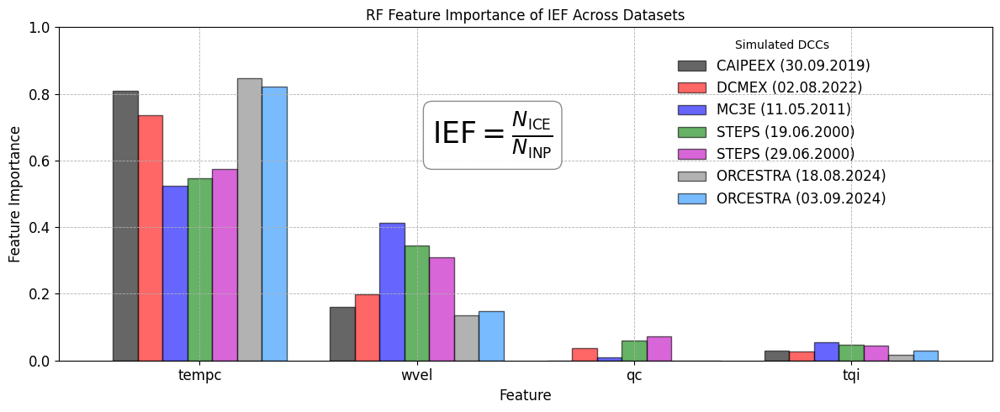

In [59]:


plt.style.use('default')

datasets = [
    ('CAIPEEX (30.09.2019)', df_all_bins_caipeex),
    ('DCMEX (02.08.2022)', df_all_bins_dcmex),
    ('MC3E (11.05.2011)', df_all_bins_mc3e),
    ('STEPS (19.06.2000)', df_all_bins_steps1906),
    ('STEPS (29.06.2000)', df_all_bins_steps2906),
    ('ORCESTRA (18.08.2024)', df_all_bins_orc1808),
    ('ORCESTRA (03.09.2024)', df_all_bins_orc0309)
]

importances_list = []
dataset_names = []

for name, df in datasets:
    df['log_ief'] = np.log(df['ief']) 
    
    features = ['tempc', 'wvel', 'qc', 'tqi']
    X = df[features]
    y = df['log_ief']
    
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)
    
    rf = RandomForestRegressor(n_estimators=100, random_state=0)
    rf.fit(X_scaled, y)

    print(f"R2 score {name} =  {rf.score(X_scaled, y):.2f}")
    
    importances = pd.Series(rf.feature_importances_, index=features)
    
    importances_list.append(importances)
    dataset_names.append(name)


importances_df = pd.concat(importances_list, axis=1)
importances_df.columns = dataset_names

fnt=12; al=0.6;
colors = ['k', 'r', 'b', 'g', 'm', 'gray', 'dodgerblue']


ax = importances_df.plot(kind='bar', figsize=(12, 5), color=colors, edgecolor='black', width=0.8, alpha=al)

plt.ylim(0, 1)
plt.xticks(fontsize=fnt)
plt.yticks(fontsize=fnt)
plt.title('RF Feature Importance of IEF Across Datasets', fontsize=fnt)
plt.ylabel('Feature Importance', fontsize=fnt)
plt.xlabel('Feature', fontsize=fnt)
plt.xticks(rotation=0)

plt.grid(True, linestyle='--', linewidth=0.6)
plt.legend(frameon=False, title='Simulated DCCs', loc='best', fontsize=fnt, bbox_to_anchor=(0.9, 1))


eq_text = r"$\mathrm{IEF} = \frac{N_{\mathrm{ICE}}}{N_{\mathrm{INP}}}$"
plt.text(0.4, 0.65, eq_text, transform=plt.gca().transAxes, fontsize=25, bbox=dict(boxstyle="round", fc="w", ec="0.5", alpha=0.9))

plt.tight_layout()
plt.show()


#r2 = rf.score(X_scaled, y)
#print(f"R2 score: {r2:.2f}")

Processing: CAIPEEX (30.09.2019)


 99%|===================| 4985/5012 [01:09<00:00]        

R2 score CAIPEEX (30.09.2019) =  0.97
Processing: DCMEX (02.08.2022)


 99%|===================| 3246/3283 [00:40<00:00]        

R2 score DCMEX (02.08.2022) =  0.97
Processing: MC3E (11.05.2011)


100%|===================| 11537/11550 [03:48<00:00]        

R2 score MC3E (11.05.2011) =  0.93
Processing: STEPS (19.06.2000)


100%|===================| 8205/8210 [02:34<00:00]        

R2 score STEPS (19.06.2000) =  0.94
Processing: STEPS (29.06.2000)


100%|===================| 9849/9873 [03:27<00:00]        

R2 score STEPS (29.06.2000) =  0.92
Processing: ORCESTRA (18.08.2024)


 99%|===================| 4260/4301 [00:57<00:00]        

R2 score ORCESTRA (18.08.2024) =  0.98
Processing: ORCESTRA (03.09.2024)


 99%|===================| 8568/8633 [02:20<00:01]        

R2 score ORCESTRA (03.09.2024) =  0.98


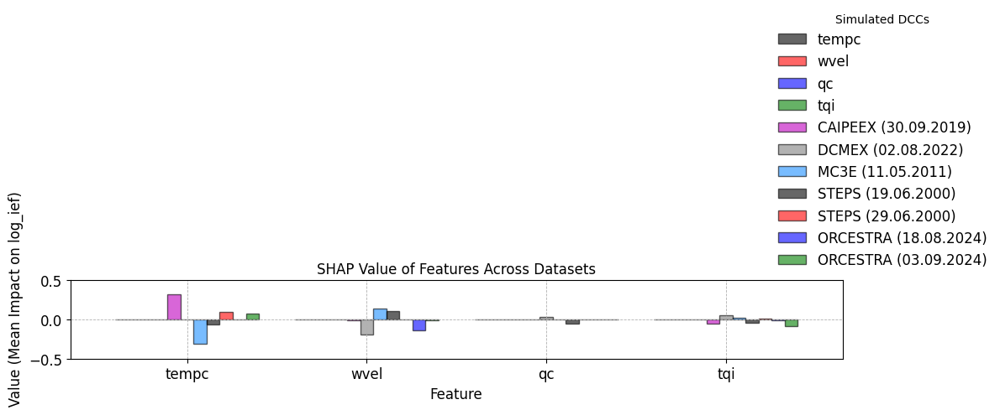

In [61]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestRegressor
from sklearn.preprocessing import StandardScaler
import shap
import warnings

warnings.filterwarnings('ignore')  # Optional: clean output

plt.style.use('default')  # Clean plot style

# Dataset list
datasets = [
    ('CAIPEEX (30.09.2019)', df_all_bins_caipeex),
    ('DCMEX (02.08.2022)', df_all_bins_dcmex),
    ('MC3E (11.05.2011)', df_all_bins_mc3e),
    ('STEPS (19.06.2000)', df_all_bins_steps1906),
    ('STEPS (29.06.2000)', df_all_bins_steps2906),
    ('ORCESTRA (18.08.2024)', df_all_bins_orc1808),
    ('ORCESTRA (03.09.2024)', df_all_bins_orc0309)
]

shap_values_list = []
dataset_names = []

# Loop through each dataset
for name, df in datasets:
    print(f"Processing: {name}")
    
    # Clean data
    df = df.copy()
    df = df[df['ief'] > 0].dropna(subset=['tempc', 'wvel', 'qc', 'tqi', 'ief'])
    df['log_ief'] = np.log(df['ief'])

    # Features and target
    features = ['tempc', 'wvel', 'qc', 'tqi']
    X = df[features]
    y = df['log_ief']
    
    # Scale features
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)
    
    # Train Random Forest
    rf = RandomForestRegressor(n_estimators=100, random_state=0)
    rf.fit(X_scaled, y)

    # SHAP Explainer
    explainer = shap.Explainer(rf, X_scaled)
    shap_values = explainer(X_scaled, check_additivity=False)
    
    # Store SHAP values for plotting
    shap_values_list.append(shap_values)
    dataset_names.append(name)
    
    # Print R2 score for the current model
    print(f"R2 score {name} =  {rf.score(X_scaled, y):.2f}")

# Plot SHAP values for each dataset
fnt = 12
al = 0.6
colors = ['k', 'r', 'b', 'g', 'm', 'gray', 'dodgerblue']

# Create an empty dataframe to hold the SHAP values
shap_values_df = pd.DataFrame(columns=features)

# Loop through SHAP values and add them to the dataframe
for i, shap_values in enumerate(shap_values_list):
    shap_df = pd.DataFrame(shap_values.values, columns=features)
    shap_values_df[dataset_names[i]] = shap_df.mean(axis=0)

# Plotting the SHAP values for each feature
ax = shap_values_df.plot(kind='bar', figsize=(12, 5), color=colors, edgecolor='black', width=0.8, alpha=al)

plt.ylim(-0.5, 0.5)  # SHAP values are typically small
plt.xticks(fontsize=fnt)
plt.yticks(fontsize=fnt)
plt.title('SHAP Value of Features Across Datasets', fontsize=fnt)
plt.ylabel('SHAP Value (Mean Impact on log_ief)', fontsize=fnt)
plt.xlabel('Feature', fontsize=fnt)
plt.xticks(rotation=0)

plt.grid(True, linestyle='--', linewidth=0.6)
plt.legend(frameon=False, title='Simulated DCCs', loc='best', fontsize=fnt, bbox_to_anchor=(0.9, 1))

# Equation text for IEF
#eq_text = r"$\mathrm{IEF} = \frac{N_{\mathrm{ICE}}}{N_{\mathrm{INP}}}$"
#plt.text(0.4, 0.65, eq_text, transform=plt.gca().transAxes, fontsize=25, bbox=dict(boxstyle="round", fc="w", ec="0.5", alpha=0.9))

plt.tight_layout()
plt.show()


### SHAP dependence of temperature on log_IEF

Processing: CAIPEEX (30.09.2019)


100%|===================| 4994/5012 [01:08<00:00]        

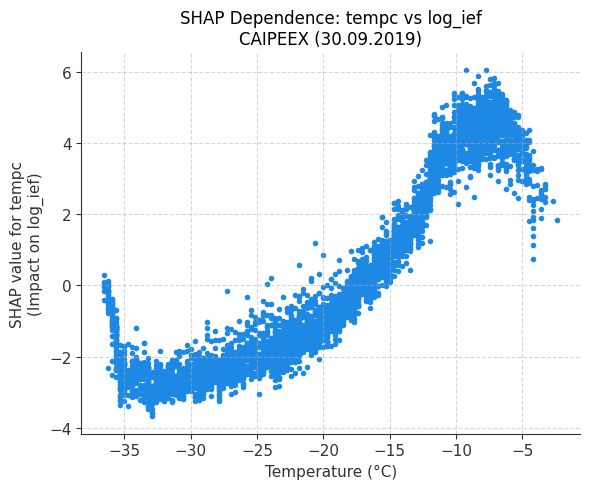

Processing: DCMEX (02.08.2022)


100%|===================| 3273/3283 [00:41<00:00]        

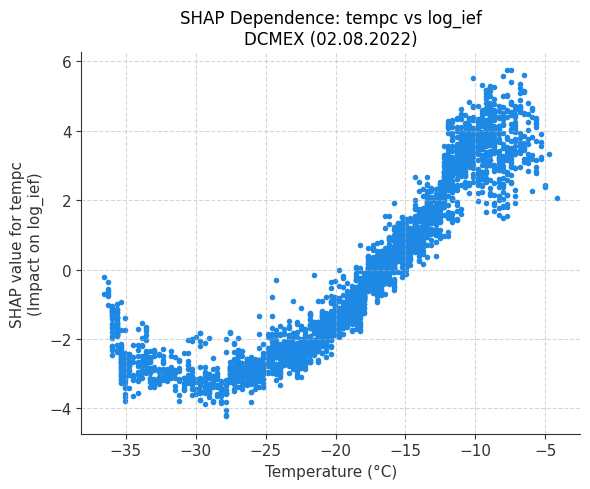

Processing: MC3E (11.05.2011)


 99%|===================| 11492/11550 [03:46<00:01]        

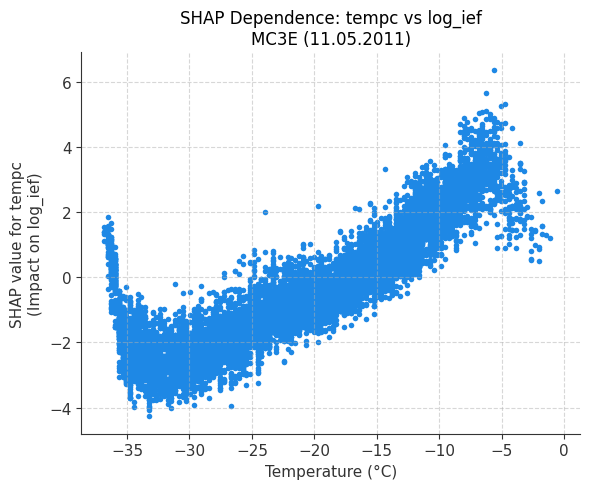

Processing: STEPS (19.06.2000)


100%|===================| 8181/8210 [02:33<00:00]        

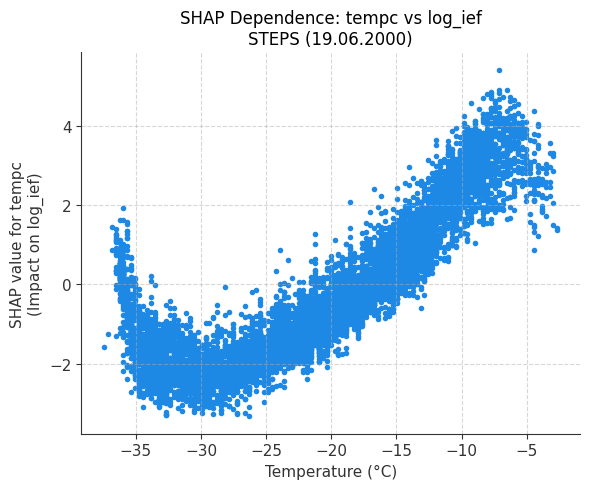

Processing: STEPS (29.06.2000)


100%|===================| 9862/9873 [03:27<00:00]        

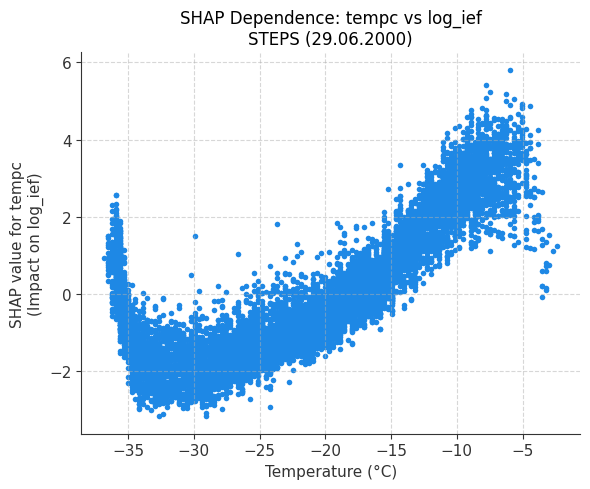

Processing: ORCESTRA (18.08.2024)


100%|===================| 4282/4301 [00:58<00:00]        

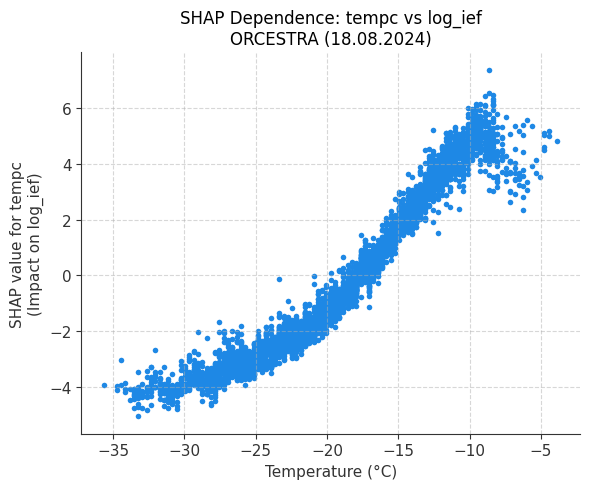

Processing: ORCESTRA (03.09.2024)


100%|===================| 8592/8633 [02:23<00:00]        

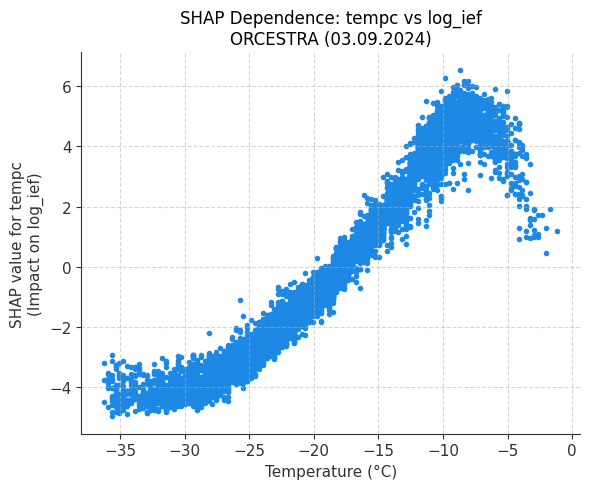

In [27]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestRegressor
from sklearn.preprocessing import StandardScaler
import shap
import warnings
warnings.filterwarnings('ignore')  # Optional: clean output

# Set plot style
plt.style.use('default')

# Dataset list
datasets = [
    ('CAIPEEX (30.09.2019)', df_all_bins_caipeex),
    ('DCMEX (02.08.2022)', df_all_bins_dcmex),
    ('MC3E (11.05.2011)', df_all_bins_mc3e),
    ('STEPS (19.06.2000)', df_all_bins_steps1906),
    ('STEPS (29.06.2000)', df_all_bins_steps2906),
    ('ORCESTRA (18.08.2024)', df_all_bins_orc1808),
    ('ORCESTRA (03.09.2024)', df_all_bins_orc0309)
]

# Features and target
features = ['tempc', 'wvel', 'qc', 'tqi']
target = 'ief'

# Loop through each dataset
for name, df in datasets:
    print(f"Processing: {name}")
    
    # Drop rows with missing or zero/non-positive IEF to avoid log issues
    df = df.copy()
    df = df[df[target] > 0].dropna(subset=features + [target])
    df['log_ief'] = np.log(df[target])
    
    # Features and target
    X = df[features]
    y = df['log_ief']
    
    # Scale features
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)
    
    # Train Random Forest
    rf = RandomForestRegressor(n_estimators=100, random_state=0)
    rf.fit(X_scaled, y)
    
    # SHAP Explainer
    explainer = shap.Explainer(rf, X_scaled)
    shap_values = explainer(X_scaled, check_additivity=False)

    # SHAP Dependence Plot for temperature
    shap.dependence_plot(
        ind='tempc', 
        shap_values=shap_values.values,   # matrix of SHAP values
        features=X,                       # unscaled features for axes
        interaction_index=None,
        show=False
    )

    # Custom plot settings
    plt.xlim(0, -40)
    plt.ylim(-6, 8)
    plt.title(f"SHAP Dependence: tempc vs log_ief\n{name}", fontsize=12)
    plt.xlabel("Temperature (°C)", fontsize=11)
    plt.ylabel("SHAP value for tempc\n(Impact on log_ief)", fontsize=11)
    plt.grid(True, linestyle='--', alpha=0.5)
    plt.tight_layout()
    plt.show()


### SHAP dependence of temperature and wvel on log_IEF

Processing: CAIPEEX (30.09.2019)


100%|===================| 5000/5012 [01:09<00:00]        

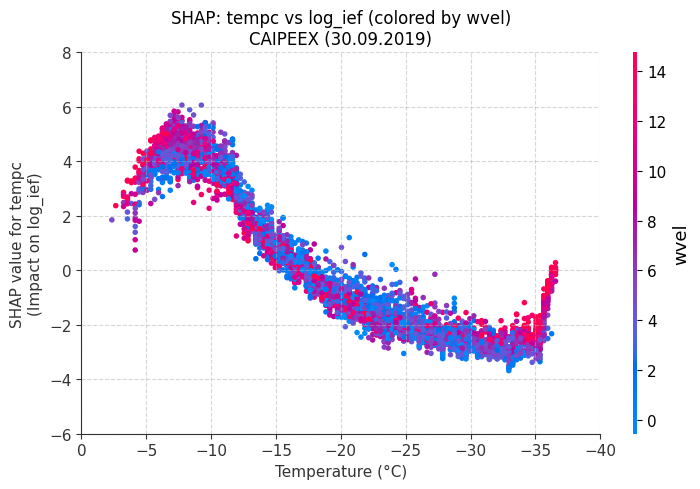

In [28]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestRegressor
from sklearn.preprocessing import StandardScaler
import shap
import warnings
warnings.filterwarnings('ignore')  # Optional: clean output

# Set plot style
plt.style.use('default')

# Dataset list
datasets = [
    ('CAIPEEX (30.09.2019)', df_all_bins_caipeex)#,
    #('DCMEX (02.08.2022)', df_all_bins_dcmex),
    #('MC3E (11.05.2011)', df_all_bins_mc3e),
    #('STEPS (19.06.2000)', df_all_bins_steps1906),
    #('STEPS (29.06.2000)', df_all_bins_steps2906),
    #('ORCESTRA (18.08.2024)', df_all_bins_orc1808),
    #('ORCESTRA (03.09.2024)', df_all_bins_orc0309)
]

# Features and target
features = ['tempc', 'wvel', 'qc', 'tqi']
target = 'ief'

# Loop through each dataset
for name, df in datasets:
    print(f"Processing: {name}")
    
    # Drop rows with missing or zero/non-positive IEF to avoid log issues
    df = df.copy()
    df = df[df[target] > 0].dropna(subset=features + [target])
    df['log_ief'] = np.log(df[target])
    
    # Features and target
    X = df[features]
    y = df['log_ief']
    
    # Scale features
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)
    
    # Train Random Forest
    rf = RandomForestRegressor(n_estimators=100, random_state=0)
    rf.fit(X_scaled, y)
    
    # SHAP Explainer
    explainer = shap.Explainer(rf, X_scaled)
    shap_values = explainer(X_scaled, check_additivity=False)

    # SHAP Dependence Plot for temperature
    shap.dependence_plot(
    ind='tempc',                      # Primary feature on x-axis
    shap_values=shap_values.values,  # SHAP values matrix
    features=X,                      # Unscaled features
    interaction_index='wvel',        # Color points by wvel
    show=False
    )

    plt.title(f"SHAP: tempc vs log_ief (colored by wvel)\n{name}", fontsize=12)
    plt.xlim(0, -40)
    plt.ylim(-6, 8)
    plt.xlabel("Temperature (°C)", fontsize=11)
    plt.ylabel("SHAP value for tempc\n(Impact on log_ief)", fontsize=11)
    plt.grid(True, linestyle='--', alpha=0.5)
    plt.tight_layout()
    plt.show()


Processing: CAIPEEX (30.09.2019)


 99%|===================| 4940/5012 [01:08<00:00]        

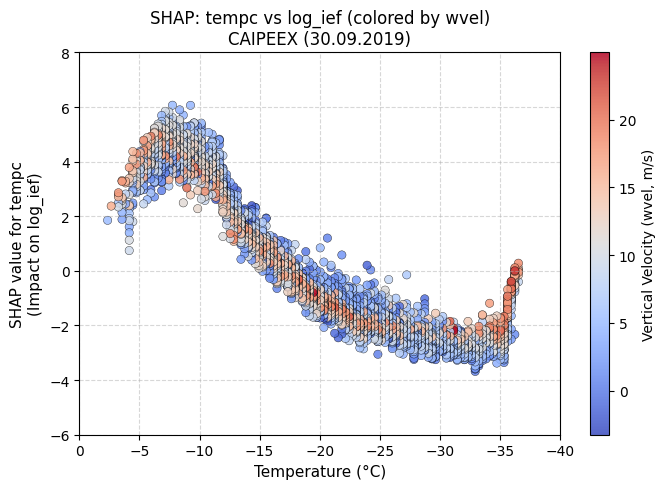

In [33]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestRegressor
from sklearn.preprocessing import StandardScaler
import shap
import warnings

warnings.filterwarnings('ignore')  # Optional: clean output
plt.style.use('default')           # Clean plot style

# Dataset list
datasets = [
    ('CAIPEEX (30.09.2019)', df_all_bins_caipeex),
    # Add more datasets here if desired
]

# Features and target
features = ['tempc', 'wvel', 'qc', 'tqi']
target = 'ief'

# Loop through each dataset
for name, df in datasets:
    print(f"Processing: {name}")
    
    # Clean data
    df = df.copy()
    df = df[df[target] > 0].dropna(subset=features + [target])
    df['log_ief'] = np.log(df[target])
    
    # Feature matrix and target
    X = df[features]
    y = df['log_ief']
    
    # Scale features
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)
    
    # Train model
    rf = RandomForestRegressor(n_estimators=100, random_state=0)
    rf.fit(X_scaled, y)
    
    # Compute SHAP values
    explainer = shap.Explainer(rf, X_scaled)
    shap_values = explainer(X_scaled, check_additivity=False)

    # Convert SHAP values to DataFrame for easy access
    shap_df = pd.DataFrame(shap_values.values, columns=features)

    # Extract SHAP values for tempc
    shap_tempc = shap_df['tempc'].values

    # Extract unscaled tempc and wvel for plotting
    tempc_vals = X['tempc'].values
    wvel_vals = X['wvel'].values

    # Plot SHAP value of tempc vs tempc, colored by wvel
    plt.figure(figsize=(7, 5))
    sc = plt.scatter(
        tempc_vals, shap_tempc,
        c=wvel_vals,
        cmap='coolwarm',    # Colormap for wvel
        edgecolor='k',
        alpha=0.85,
        linewidth=0.3
    )

    # Add colorbar for wvel
    cbar = plt.colorbar(sc)
    cbar.set_label("Vertical Velocity (wvel, m/s)", fontsize=10)

    # Labels and limits
    plt.title(f"SHAP: tempc vs log_ief (colored by wvel)\n{name}", fontsize=12)
    plt.xlabel("Temperature (°C)", fontsize=11)
    plt.ylabel("SHAP value for tempc\n(Impact on log_ief)", fontsize=11)
    plt.xlim(0, -40)
    plt.ylim(-6, 8)
    plt.grid(True, linestyle='--', alpha=0.5)
    plt.tight_layout()
    plt.show()


Processing: CAIPEEX (30.09.2019)


 99%|===================| 4949/5012 [01:08<00:00]        

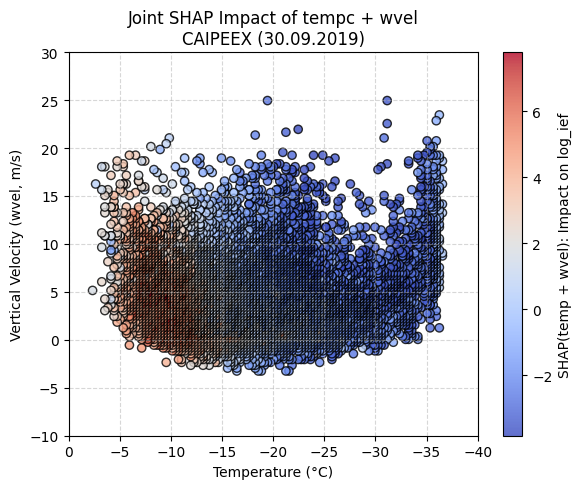

In [31]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestRegressor
from sklearn.preprocessing import StandardScaler
import shap
import warnings
warnings.filterwarnings('ignore')  # Optional: clean output

# Set plot style
plt.style.use('default')

# Dataset list
datasets = [
    ('CAIPEEX (30.09.2019)', df_all_bins_caipeex)#,
    #('DCMEX (02.08.2022)', df_all_bins_dcmex),
    #('MC3E (11.05.2011)', df_all_bins_mc3e),
    #('STEPS (19.06.2000)', df_all_bins_steps1906),
    #('STEPS (29.06.2000)', df_all_bins_steps2906),
    #('ORCESTRA (18.08.2024)', df_all_bins_orc1808),
    #('ORCESTRA (03.09.2024)', df_all_bins_orc0309)
]

# Features and target
features = ['tempc', 'wvel', 'qc', 'tqi']
target = 'ief'

# Loop through each dataset
for name, df in datasets:
    print(f"Processing: {name}")
    
    # Drop rows with missing or zero/non-positive IEF to avoid log issues
    df = df.copy()
    df = df[df[target] > 0].dropna(subset=features + [target])
    df['log_ief'] = np.log(df[target])
    
    # Features and target
    X = df[features]
    y = df['log_ief']
    
    # Scale features
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)
    
    # Train Random Forest
    rf = RandomForestRegressor(n_estimators=100, random_state=0)
    rf.fit(X_scaled, y)
    
    # SHAP Explainer
    explainer = shap.Explainer(rf, X_scaled)
    shap_values = explainer(X_scaled, check_additivity=False)

    shap_df = pd.DataFrame(shap_values.values, columns=features)

    # Sum of SHAP values for tempc + wvel (joint effect)
    shap_joint = shap_df['tempc'] + shap_df['wvel']

    plt.figure(figsize=(6, 5))
    sc = plt.scatter(
        X['tempc'], X['wvel'], 
        c=shap_joint, cmap='coolwarm', edgecolor='k', alpha=0.8
        )
    plt.xlim(0, -40)
    plt.ylim(-10, 30)
    plt.xlabel('Temperature (°C)')
    plt.ylabel('Vertical Velocity (wvel, m/s)')
    plt.title(f"Joint SHAP Impact of tempc + wvel\n{name}")
    plt.grid(True, linestyle='--', alpha=0.5)
    cbar = plt.colorbar(sc)
    cbar.set_label('SHAP(temp + wvel): Impact on log_ief')
    plt.tight_layout()
    plt.show()


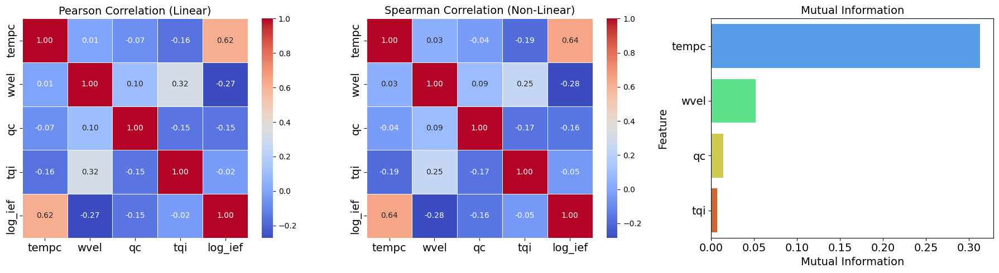

In [6]:

### CAIPEEX
pearson_corr_all_cases = df_combined_all_bins[['tempc', 'wvel', 'qc', 'tqi', 'log_ief']].corr()
spearman_corr_all_cases = df_combined_all_bins[['tempc', 'wvel', 'qc', 'tqi', 'log_ief']].corr(method='spearman')

X_all_cases = df_combined_all_bins[['tempc', 'wvel', 'qc', 'tqi']]
y_all_cases = df_combined_all_bins['log_ief']
mi_all_cases = mutual_info_regression(X_all_cases, y_all_cases)
mi_df_all_cases = pd.DataFrame({'Feature': X_all_cases.columns, 'Mutual Information': mi_all_cases}).sort_values('Mutual Information', ascending=False)

###############################################################################

fnt=14;
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

sns.heatmap(pearson_corr_all_cases, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5, ax=axes[0])
axes[0].set_title('Pearson Correlation (Linear)', fontsize=fnt)
axes[0].tick_params(axis='both', labelsize=fnt)

sns.heatmap(spearman_corr_all_cases, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5, ax=axes[1])
axes[1].set_title('Spearman Correlation (Non-Linear)', fontsize=fnt)
axes[1].tick_params(axis='both', labelsize=fnt)

sns.barplot(x='Mutual Information', y='Feature', data=mi_df_all_cases, palette='turbo', ax=axes[2])
axes[2].set_title('Mutual Information', fontsize=fnt)
axes[2].set_xlabel('Mutual Information', fontsize=fnt)
axes[2].tick_params(axis='both', labelsize=fnt)
axes[2].set_ylabel('Feature', fontsize=fnt)

plt.tight_layout()
plt.show()


## Plotting ief over temperature and vertical velocity

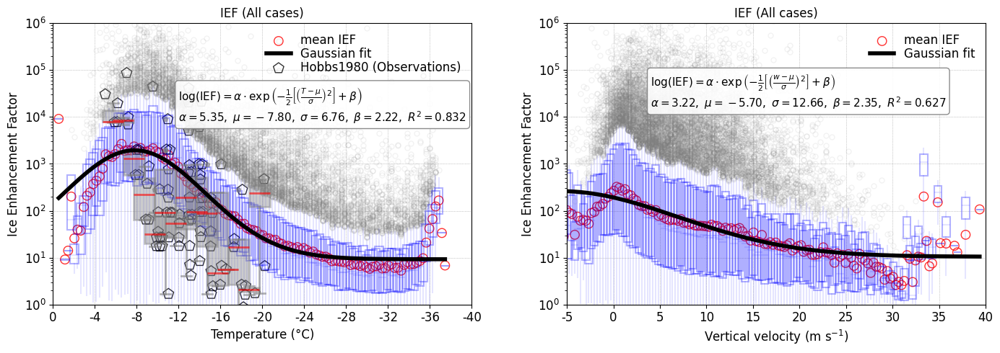

In [13]:

#====================================================
# Fitting Equation
#====================================================

def gauss_T(x, A, mu, sigma, C):
    """Gaussian in temperature (°C), returns ln(IEF)."""
    return A * np.exp(-0.5 * ((x - mu) / sigma) ** 2) + C

#====================================================
# Dataset
#====================================================

df_ief = df_combined_all_bins
df_ief = df_ief[df_ief['ief'] >= 1]

#====================================================
# Fitting ief to temperature
#====================================================

grouped_ief_tempc = df_ief.groupby('tempc')['ief']
grouped_ief_tempc_log = df_ief.groupby('tempc')['log_ief']

ief_tempc_mean = grouped_ief_tempc.mean()
ief_tempc_median = grouped_ief_tempc.median()
ief_tempc_log_mean = grouped_ief_tempc_log.mean()
ief_tempc_log_median = grouped_ief_tempc_log.median()   
ief_tempc_std_dev = grouped_ief_tempc.std()
ief_tempc_std_err = grouped_ief_tempc.sem()

ief_tempc_q25 = grouped_ief_tempc.quantile(0.25)
ief_tempc_q75 = grouped_ief_tempc.quantile(0.75)
ief_tempc_lower_err = ief_tempc_median - ief_tempc_q25
ief_tempc_upper_err = ief_tempc_q75 - ief_tempc_median

# Binning the data
temp_sorted = sorted(grouped_ief_tempc.groups.keys(), reverse=True)
temp_log_sorted = sorted(grouped_ief_tempc_log.groups.keys(), reverse=True)
data_tempc_per_bin = [grouped_ief_tempc.get_group(t) for t in temp_sorted]
data_tempc_log_per_bin = [grouped_ief_tempc_log.get_group(t) for t in temp_log_sorted]

#########################################
xC_tempc_deg = np.array(temp_log_sorted)  # already in °C
yC_tempc_ln = np.array(ief_tempc_log_mean[temp_log_sorted])  # ln(IEF)
n_tempc_per_bin = np.array([len(g) for g in data_tempc_per_bin])

# Fit in log-space (to match boxplot + scatter)
x_tempc_fit = np.array(temp_log_sorted)                        # Temperature bins (°C)
y_tempc_ief_fit = np.array(ief_tempc_log_mean[temp_log_sorted])            # Median in log-space

x_tempc_data = x_tempc_fit
y_tempc_ief_data = y_tempc_ief_fit 

p0 = [np.max(yC_tempc_ln) - np.min(yC_tempc_ln), -10.0, 5.0, np.min(yC_tempc_ln)]
width = np.sqrt(n_tempc_per_bin)

params, cov = curve_fit(
    gauss_T, xC_tempc_deg, yC_tempc_ln, p0=p0, sigma=1.0/width,
    absolute_sigma=False, maxfev=5000
)
alpha_tempc_fit, mu_tempc_fit, sigma_tempc_fit, beta_tempc_fit = params

# Evaluate fit
y_tempc_fit_ln = gauss_T(xC_tempc_deg, *params)
y_tempc_fit = np.exp(y_tempc_fit_ln)
r2_tempc = 1 - np.sum((yC_tempc_ln - y_tempc_fit_ln) ** 2) / np.sum((yC_tempc_ln - np.mean(yC_tempc_ln)) ** 2)
#########################################

#====================================================
# End fitting ief to temperature
#====================================================

#====================================================
# Fitting ief to w
#====================================================

grouped_ief_wvel = df_ief.groupby('wvel')['ief']
grouped_ief_wvel_log = df_ief.groupby('wvel')['log_ief']

ief_wvel_mean = grouped_ief_tempc.mean()
ief_wvel_median = grouped_ief_tempc.median()
ief_wvel_log_mean = grouped_ief_wvel_log.mean()
ief_wvel_log_median = grouped_ief_wvel_log.median()   
ief_wvel_std_dev = grouped_ief_wvel.std()
ief_wvel_std_err = grouped_ief_wvel.sem()

ief_wvel_q25 = grouped_ief_wvel.quantile(0.25)
ief_wvel_q75 = grouped_ief_wvel.quantile(0.75)
ief_wvel_lower_err = ief_wvel_median - ief_wvel_q25
ief_wvel_upper_err = ief_wvel_q75 - ief_wvel_median

# Binning the data
wvel_sorted = sorted(grouped_ief_wvel.groups.keys(), reverse=True)
wvel_log_sorted = sorted(grouped_ief_wvel_log.groups.keys(), reverse=True)
data_wvel_per_bin = [grouped_ief_wvel.get_group(t) for t in wvel_sorted]
data_wvel_log_per_bin = [grouped_ief_wvel_log.get_group(t) for t in wvel_log_sorted]

#########################################
xC_wvel_deg = np.array(wvel_log_sorted)  # already in °C
yC_wvel_ln = np.array(ief_wvel_log_mean[wvel_log_sorted])  # ln(IEF)
n_wvel_per_bin = np.array([len(g) for g in data_wvel_per_bin])

# Fit in log-space (to match boxplot + scatter)
x_wvel_fit = np.array(wvel_log_sorted)                        # Temperature bins (°C)
y_wvel_ief_fit = np.array(ief_wvel_log_mean[wvel_log_sorted])            # Median in log-space

x_wvel_data = x_wvel_fit
y_wvel_ief_data = y_wvel_ief_fit 

p0 = [np.max(yC_wvel_ln) - np.min(yC_wvel_ln), -10.0, 5.0, np.min(yC_wvel_ln)]
width = np.sqrt(n_wvel_per_bin)

params, cov = curve_fit(
    gauss_T, xC_wvel_deg, yC_wvel_ln, p0=p0, sigma=1.0/width,
    absolute_sigma=False, maxfev=5000
)
alpha_wvel_fit, mu_wvel_fit, sigma_wvel_fit, beta_wvel_fit = params

# Evaluate fit
y_wvel_fit_ln = gauss_T(xC_wvel_deg, *params)
y_wvel_fit = np.exp(y_wvel_fit_ln)
r2_wvel = 1 - np.sum((yC_wvel_ln - y_wvel_fit_ln) ** 2) / np.sum((yC_wvel_ln - np.mean(yC_wvel_ln)) ** 2)
#########################################

#====================================================
# End fitting ief to w
#====================================================


# ==========================================================
# Hobbs et al. 1980 Observations
# ==========================================================

q95 = df_hobbs1980['ief'].quantile(0.95)
df_hobbs_filt = df_hobbs1980[df_hobbs1980['ief'] <= q95]

bins = np.arange(df_hobbs_filt.tempc.min(), df_hobbs_filt.tempc.max() + 1, 1)
df_hobbs_filt['temp_bin'] = pd.cut(df_hobbs_filt.tempc, bins)

# Group by bins & get ief values
grouped_hobbs = df_hobbs_filt.groupby('temp_bin')['ief']

boxplot_hobbs_data = [grouped_hobbs.get_group(bin) for bin in grouped_hobbs.groups]

tempc_bin_hobbs_centers = [interval.mid for interval in grouped_hobbs.groups.keys()]
#========================= Hobbs observations End 

# Plot
fnt = 12
ln = 2
wd=0.8
ln1 = 1.5
al1 = 0.3
al2 = 0.1

plt.figure(figsize=(14,5))
plt.style.use('default')
plt.subplot(1,2,1)
plt.scatter(x_tempc_data, np.exp(y_tempc_ief_data), color='red', s=80, alpha=0.8, facecolor='none', edgecolor='red', label='mean IEF')

plt.plot(x_tempc_data, y_tempc_fit, color='k', lw=ln+2, zorder=5, label='Gaussian fit')

box = plt.boxplot(data_tempc_per_bin, positions=temp_sorted, vert=True, patch_artist=True, widths=wd,
                  boxprops=dict(facecolor='none', edgecolor='blue', linewidth=ln1, alpha=al1), 
                  medianprops=dict(color='blue', linewidth=ln1, alpha=al2),
                  whiskerprops=dict(linewidth=ln1, color='blue', alpha=al2),
                  capprops=dict(linewidth=ln1, color='none', alpha=al2),
                  flierprops=dict(marker='o', markerfacecolor='None', markeredgecolor='gray', 
                                  markersize=5, alpha=al2), showfliers=True)


plt.boxplot(boxplot_hobbs_data, positions=tempc_bin_hobbs_centers, vert=True, patch_artist=True, widths=2,
            boxprops=dict(facecolor='gray', edgecolor='gray', linewidth=2, alpha=0.4),
            medianprops=dict(color='red', linewidth=2, alpha=0.6),
            whiskerprops=dict(linewidth=2, color='gray', alpha=0.6),
            capprops=dict(linewidth=2, color='gray', alpha=0.6),
            flierprops=dict(marker='p', markerfacecolor='gray', markeredgecolor='gray',
            markersize=5, alpha=0.6), showfliers=True)

plt.scatter(df_hobbs1980.tempc, df_hobbs1980.ief, color='k', marker='p', s=120, alpha=0.8,
            facecolor='none', edgecolor='k', label='Hobbs1980 (Observations)')


plt.yscale('log')
plt.xlim(0., -40.)  
plt.xticks(ticks=[0, -4, -8, -12, -16, -20, -24, -28, -32, -36, -40],
           labels=[str(x) for x in [0, -4, -8, -12, -16, -20, -24, -28, -32, -36, -40]], fontsize=fnt)

plt.ylim(1.0, 1.e6)
plt.xticks(fontsize=fnt)
plt.yticks(fontsize=fnt)

plt.xlabel('Temperature (°C)', fontsize=fnt)
plt.ylabel('Ice Enhancement Factor', fontsize=fnt)   # <-- now log(IEF), not raw IEF
plt.title('IEF (All cases)', fontsize=fnt)

plt.grid(True, linestyle=':', linewidth=0.5, color='grey', alpha=0.8)

eq_text = (
    r"$\log(\mathrm{IEF}) = \alpha \cdot \exp\left(-\frac{1}{2} \left[ \left(\frac{T - \mu}{\sigma}\right)^2 \right] + \beta \right)$"
    + "\n"
    + rf"$\alpha = {alpha_tempc_fit:.2f},\ \mu = {mu_tempc_fit:.2f},\ \sigma = {sigma_tempc_fit:.2f},\ \beta = {beta_tempc_fit:.2f},\ R^2 = {r2_tempc:.3f}$"
)

plt.text(0.3, 0.65, eq_text, transform=plt.gca().transAxes, fontsize=11, bbox=dict(boxstyle="round", fc="w", ec="0.5", alpha=0.9))

plt.legend(frameon=False, handlelength=2, labelspacing=0.05, fontsize=fnt, ncols=1, loc='best')



plt.subplot(1,2,2)
plt.scatter(x_wvel_data, np.exp(y_wvel_ief_data), color='red', s=80, alpha=0.8, facecolor='none', edgecolor='red', label='mean IEF')

plt.plot(x_wvel_data, y_wvel_fit, color='k', lw=ln+2, zorder=5, label='Gaussian fit')

box = plt.boxplot(data_wvel_per_bin, positions=wvel_sorted, vert=True, patch_artist=True, widths=wd,
                  boxprops=dict(facecolor='none', edgecolor='blue', linewidth=ln1, alpha=al1), 
                  medianprops=dict(color='blue', linewidth=ln1, alpha=al2),
                  whiskerprops=dict(linewidth=ln1, color='blue', alpha=al2),
                  capprops=dict(linewidth=ln1, color='none', alpha=al2),
                  flierprops=dict(marker='o', markerfacecolor='None', markeredgecolor='gray', 
                                  markersize=5, alpha=al2), showfliers=True)


plt.yscale('log')
plt.xlim(-5., 40.)  
plt.xticks(ticks=[-5, 0, 5, 10, 15, 20, 25, 30, 35, 40],
           labels=[str(x) for x in [-5, 0, 5, 10, 15, 20, 25, 30, 35, 40]], fontsize=fnt)

plt.ylim(1.0, 1.e6)
plt.xticks(fontsize=fnt)
plt.yticks(fontsize=fnt)

plt.xlabel('Vertical velocity (m s$^{-1}$)', fontsize=fnt)
plt.ylabel('Ice Enhancement Factor', fontsize=fnt)   # <-- now log(IEF), not raw IEF
plt.title('IEF (All cases)', fontsize=fnt)

plt.grid(True, linestyle=':', linewidth=0.5, color='grey', alpha=0.8)

eq_text = (
    r"$\log(\mathrm{IEF}) = \alpha \cdot \exp\left(-\frac{1}{2} \left[ \left(\frac{w - \mu}{\sigma}\right)^2 \right] + \beta \right)$"
    + "\n"
    + rf"$\alpha = {alpha_wvel_fit:.2f},\ \mu = {mu_wvel_fit:.2f},\ \sigma = {sigma_wvel_fit:.2f},\ \beta = {beta_wvel_fit:.2f},\ R^2 = {r2_wvel:.3f}$"
)

plt.text(0.2, 0.7, eq_text, transform=plt.gca().transAxes, fontsize=11, bbox=dict(boxstyle="round", fc="w", ec="0.5", alpha=0.9))

plt.legend(frameon=False, handlelength=2, labelspacing=0.05, fontsize=fnt, ncols=1, loc='best')

plt.tight_layout()
plt.show()


## Plotting ief in 2D (Temperature and Vertical Velocity) 

### Heatmap

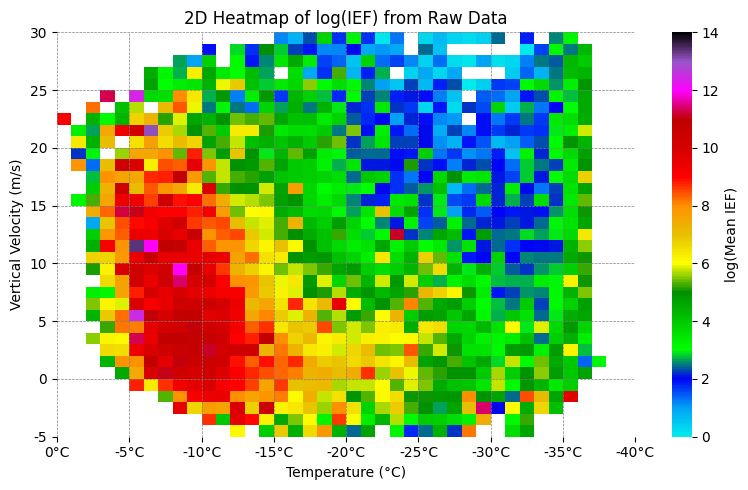

In [14]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

#temp_bins = np.linspace(-40, 1, 41) 
temp_bins = np.arange(-40, 1, 1) 
#w_bins = np.linspace(ds_combined_tc_w['wvel'].min().values, ds_combined_tc_w['wvel'].max().values, 40)
w_bins = np.arange(-5, 31, 1)

# Digitize to bin indices
df_ief['temp_bin'] = np.digitize(df_ief['tempc'], temp_bins) - 1
df_ief['w_bin'] = np.digitize(df_ief['wvel'], w_bins) - 1

# Create empty 2D grid for mean IEF
heatmap_data = np.full((len(w_bins) - 1, len(temp_bins) - 1), np.nan)

# Fill grid with mean IEF
for i in range(len(w_bins) - 1):
    for j in range(len(temp_bins) - 1):
        subset = df_ief[(df_ief['temp_bin'] == j) & (df_ief['w_bin'] == i)]
        if not subset.empty:
            heatmap_data[i, j] = np.mean(subset['ief'])

# Plot heatmap
plt.figure(figsize=(8, 5))


ax = sns.heatmap(
    np.log(heatmap_data),
    cmap='pyart_NWSRef',
    cbar_kws={'label': 'log(Mean IEF)'},
    xticklabels=False,
    yticklabels=False,
    vmin=0, vmax=14
)

x_tick_indices = [0, 5, 10, 15, 20, 25, 30, 35, 40]
x_tick_labels = [f"{int(temp_bins[i])}°C" for i in x_tick_indices]

#y_tick_indices = [0, 5, 10, 15, 20, 25, 30, 35]
#y_tick_labels = [f"{w_bins[i]:.1f}" for i in y_tick_indices]

y_tick_indices = [0, 5, 10, 15, 20, 25, 30, 35]
y_tick_labels = [f"{int(w_bins[i])}" for i in y_tick_indices]

# Apply them
ax.set_xticks(x_tick_indices)
ax.set_xticklabels(x_tick_labels, rotation=0)

ax.set_yticks(y_tick_indices)
ax.set_yticklabels(y_tick_labels, rotation=0)

ax.invert_xaxis()
ax.invert_yaxis()

plt.xlabel('Temperature (°C)')
plt.ylabel('Vertical Velocity (m/s)')
plt.title('2D Heatmap of log(IEF) from Raw Data')
plt.xticks(rotation=0)
plt.yticks(rotation=0)
plt.grid(True, linestyle='--', color='gray', linewidth=0.5)
plt.tight_layout()
plt.show()


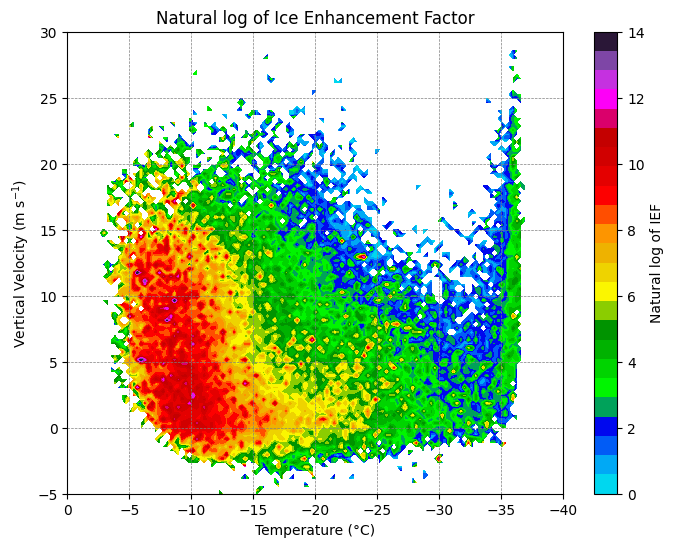

In [21]:


# Create 2D meshgrid if needed
#tempc_grid, wvel_grid = np.meshgrid(x, y)

# tempc and wvel (x, y) coordinates and ief data (z)
tempc = ds_combined_tc_w['tempc']         # 1D
wvel = ds_combined_tc_w['wvel']           # 1D
ief = ds_combined_tc_w['ief']             # 2D

log_ief = np.log(ief)

log_ief = xr.where(log_ief > 0., log_ief, np.nan)
#log_ief[log_ief < 0.] = 0.

lev=np.linspace(0, 14, 25)
#lev=np.linspace(1.e0, 1.e6, 25)
plt.figure(figsize=(8, 6))
plt.contourf(tempc, wvel, log_ief.T, shading='auto', levels=lev, cmap='pyart_NWSRef') #pyart_NWSRef #coolwarm, HomeyerRainbow, pyart_NWSRef, RdBu_r
plt.xlim(0, -40)
plt.ylim(-5, 30)
plt.colorbar(ticks=[0, 2, 4, 6, 8, 10, 12, 14], label='Natural log of IEF')
#plt.colorbar(ticks=[1.e0, 1.e2, 1.e4, 1.e6], label='Natural log of IEF')
plt.xlabel('Temperature (°C)')
plt.ylabel('Vertical Velocity (m s$^{-1}$)')
plt.title('Natural log of Ice Enhancement Factor')
plt.grid(True, linestyle='--', color='gray', linewidth=0.5)
plt.show()

In [ ]:

from matplotlib import colors

temp_1d = ds_combined_tc_w['tempc'].values.flatten()
wvel_1d = ds_combined_tc_w['wvel'].values.flatten()
ief_2d = np.log(ds_combined_tc_w['ief'].values.T)  


temp_grid, w_grid = np.meshgrid(temp_1d, wvel_1d)

temp_grid = temp_grid.flatten()
w_grid = w_grid.flatten()
ief_1d = ief_2d.flatten()

ief_1d[ief_1d <= 0] = np.nan
q95 = np.quantile(ief_1d, 0.99)

mask = ief_1d > q95
temp_grid_filt = temp_grid[mask]
w_grid_filt = w_grid[mask]
ief_1d_filt = ief_1d[mask]

#print(temp_grid_filt, w_grid_filt)

fnt=12;
fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')

levels = np.linspace(0, 14, 20)
norm = colors.BoundaryNorm(boundaries=levels, ncolors=256)

sc=ax.scatter(temp_grid, w_grid, ief_1d, c=ief_1d, cmap='pyart_NWSRef', norm=norm, alpha=0.8)
#ax.plot_trisurf(temp_grid, w_grid, ief_1d, cmap='jet', linewidth=0, antialiased=False)

ax.set_xlim(0, -40)
ax.set_ylim(-10, 40)
ax.set_zlim(0, 14)
#ax.invert_yaxis()




#ax.view_init(elev=30, azim=150)
#ax.view_init(elev=40, azim=120)
#ax.view_init(elev=40, azim=170)
ax.view_init(elev=40, azim=320)
#ax.view_init(elev=50, azim=320)
ax.invert_xaxis()

ax.set_xlabel('Temperature (°C)', fontsize=fnt)
ax.set_ylabel('Vertical Velocity (m s$^{-1}$)', fontsize=fnt)
ax.set_zlabel('log(IEF)', fontsize=fnt)

ax.set_title('Mean Ice Enhancement Factor (IEF) from 7 convective cases (ICON-NWP, 2moment)', fontsize=fnt+2)


eq_text = r"$\mathrm{IEF} = \frac{N_{\mathrm{ICE}}}{N_{\mathrm{INP}}}$"

ax.text2D(
    0.12, 0.9, eq_text,
    transform=ax.transAxes,
    fontsize=20,
    bbox=dict(boxstyle="square", fc="w", ec="0.5", alpha=0.9))


#fig.colorbar(surf, ax=ax, shrink=0.5, aspect=10, label='log(IEF)')

cbar_ax = fig.add_axes([0.9, 0.15, 0.03, 0.6])  # [left, bottom, width, height]
cbar1 = fig.colorbar(sc, cax=cbar_ax, orientation='vertical', ticks=[0, 2, 4, 6, 8, 10, 12, 14])
cbar1.set_label('Log(IEF)', fontsize=fnt)
cbar1.ax.tick_params(labelsize=fnt + 2)

plt.tight_layout()
plt.show()


In [36]:
ds_combined_tc_w['LOG_IEF'] = np.log(ds_combined_tc_w['ief'])

### Gaussian fit with log(temp)

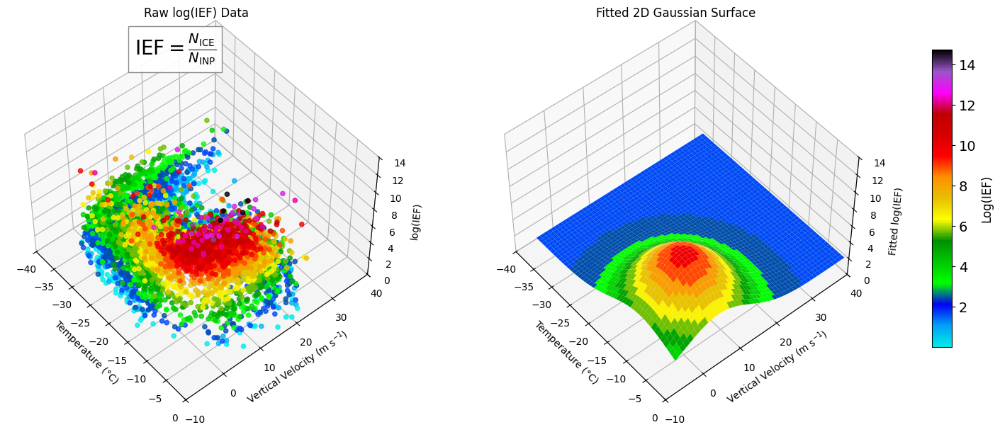

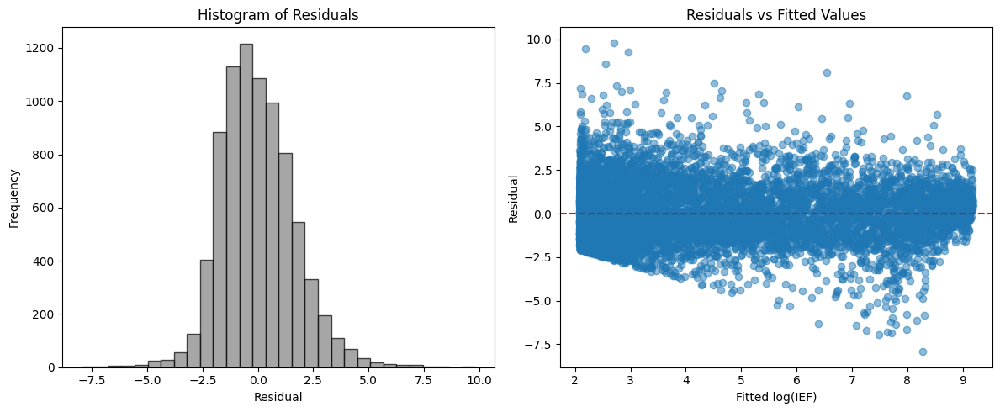

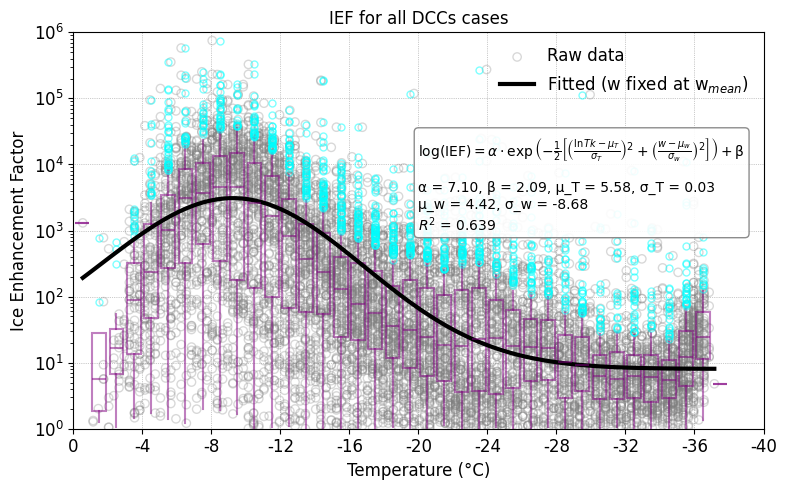

In [41]:

df_combined_tc_w = ds_combined_tc_w[['ief', 'tempc', 'wvel']].to_dataframe().dropna().reset_index()

# ---- 1. DATA PREPROCESSING ----
df_combined_tc_w['LOG_IEF'] = np.log(df_combined_tc_w['ief'])
df_combined_tc_w = df_combined_tc_w[df_combined_tc_w['ief'] >= 1]

valid_mask = (
    np.isfinite(df_combined_tc_w['LOG_IEF']) &
    np.isfinite(df_combined_tc_w['tempc']) &
    np.isfinite(df_combined_tc_w['wvel'])
)

df_ief = df_combined_tc_w[valid_mask]


T_vals = df_ief['tempc'].values
w_vals = df_ief['wvel'].values
IEF_vals = df_ief['ief'].values
log_IEF_vals = df_ief['LOG_IEF'].values
T_kelvin = T_vals + 273.16  # Temperature in Kelvin

#========== For boxplot

df_ief_tempc = pd.DataFrame({
    'T': T_vals,
    'IEF': IEF_vals
})

bin_edges = np.arange(np.floor(df_ief_tempc['T'].min()), np.ceil(df_ief_tempc['T'].max()) + 1, 1)
df_ief_tempc['T_bin'] = pd.cut(df_ief_tempc['T'], bins=bin_edges)

grouped = df_ief_tempc.groupby('T_bin')['IEF']

boxplot_tempc_ief_data = [grouped.get_group(g) for g in grouped.groups]
tempc_bin_centers = [interval.mid for interval in grouped.groups]


#========== Gaussian model

def gaussian_lnT_2d(coords, A, mu_T, sigma_T, mu_w, sigma_w, offset):
    T, w = coords
    log_T = np.log(T)
    term_T = ((log_T - mu_T) / sigma_T) ** 2
    term_w = ((w - mu_w) / sigma_w) ** 2
    #return A * np.exp(-0.5 * (term_T + term_w)) + offset
    return A * np.exp(-(1/2)*(term_T + term_w)) + offset

#========== Fitting parameters

p0 = [
    max(log_IEF_vals),            # A
    np.mean(np.log(T_kelvin)),    # mu_T
    1.0,                          # sigma_T
    np.mean(w_vals),              # mu_w
    1.0,                          # sigma_w
    np.min(log_IEF_vals)          # offset
]

params, cov = curve_fit(
    gaussian_lnT_2d,
    (T_kelvin, w_vals),
    log_IEF_vals,
    p0=p0,
    maxfev=10000
)

A_fit, mu_T_fit, sigma_T_fit, mu_w_fit, sigma_w_fit, offset_fit = params
perr = np.sqrt(np.diag(cov))

# ---- 4. METRICS ----
log_IEF_fit = gaussian_lnT_2d((T_kelvin, w_vals), *params)
residuals = log_IEF_vals - log_IEF_fit
ss_res = np.sum(residuals**2)
ss_tot = np.sum((log_IEF_vals - np.mean(log_IEF_vals))**2)
r2 = 1 - (ss_res / ss_tot)

#print("Fitted parameters:")
#print(f"A = {A_fit:.3f} ± {perr[0]:.3f}")
#print(f"mu_T = {mu_T_fit:.3f} ± {perr[1]:.3f}")
#print(f"sigma_T = {sigma_T_fit:.3f} ± {perr[2]:.3f}")
#print(f"mu_w = {mu_w_fit:.3f} ± {perr[3]:.3f}")
#print(f"sigma_w = {sigma_w_fit:.3f} ± {perr[4]:.3f}")
#print(f"offset = {offset_fit:.3f} ± {perr[5]:.3f}")
#print(f"R² = {r2:.3f}")

# ---- 5. 3D PLOT WITH SHARED COLORBAR ----
T_grid = np.linspace(np.min(T_kelvin), np.max(T_kelvin), 50)
w_grid = np.linspace(np.min(w_vals), np.max(w_vals), 50)
T_mesh, w_mesh = np.meshgrid(T_grid, w_grid)
log_IEF_mesh = gaussian_lnT_2d((T_mesh, w_mesh), *params)

vmin = min(np.min(log_IEF_vals), np.min(log_IEF_mesh))
vmax = max(np.max(log_IEF_vals), np.max(log_IEF_mesh))
norm = colors.Normalize(vmin=vmin, vmax=vmax)
cmap = plt.get_cmap('pyart_NWSRef') #coolwarm, HomeyerRainbow, pyart_NWSRef, RdBu_r
sm = ScalarMappable(norm=norm, cmap=cmap)


fnt = 12
ln = 2
wd = 0.8
ln1 = 1.5
al1 = 0.5
al2 = 0.5
fig = plt.figure(figsize=(14, 6))

# Plot 1: Raw data
ax1 = fig.add_subplot(121, projection='3d')
levels = np.linspace(0, 14, 20)
norm = colors.BoundaryNorm(boundaries=levels, ncolors=256)
sc = ax1.scatter(T_vals, w_vals, log_IEF_vals, c=log_IEF_vals, cmap=cmap, norm=norm, alpha=0.8)

#ax1.set_xlim(0, -40)
#ax1.set_ylim(-5, 30)
#ax1.set_ylim(np.min(w_vals), np.max(w_vals))
#ax1.invert_yaxis()

ax1.set_xlim(0, -40)
#ax1.set_ylim(np.min(w_vals), np.max(w_vals))
ax1.set_ylim(-10, 40)
ax1.set_zlim(0, 14)
#ax1.invert_yaxis()

#ax1.set_xlim(0, -40)
#ax1.set_ylim(-10, 40)
#ax1.set_zlim(0, 14)

#ax1.invert_yaxis()

#ax1.set_xticklabels([0, -5, -10, -15, -20, -25, -30, -35, -40], fontsize=fnt)
#ax1.set_yticklabels([-10, -5, 0, 5, 10, 15, 20, 25, 30, 35, 40], fontsize=fnt)
#ax1.set_zticklabels([0, 2, 4, 6, 8, 10, 12, 14], fontsize=fnt)

#ax1.view_init(elev=30, azim=150)
#ax1.view_init(elev=40, azim=170)
ax1.view_init(elev=50, azim=320)
ax1.invert_xaxis()

ax1.set_xlabel('Temperature (°C)')
ax1.set_ylabel('Vertical Velocity (m s$^{-1}$)')
ax1.set_zlabel('log(IEF)')
ax1.set_title('Raw log(IEF) Data')

eq_text = r"$\mathrm{IEF} = \frac{N_{\mathrm{ICE}}}{N_{\mathrm{INP}}}$"

ax1.text2D(
    0.02, 0.8, eq_text,
    transform=ax.transAxes,
    fontsize=20,
    bbox=dict(boxstyle="square", fc="w", ec="0.5", alpha=0.9))


# Plot 2: Fitted surface
ax2 = fig.add_subplot(122, projection='3d')
#sc = ax2.scatter(T_vals, w_vals, log_IEF_vals, c=log_IEF_vals, cmap=cmap, norm=norm, alpha=0.12)
surf = ax2.plot_surface(T_mesh - 273.16, w_mesh, log_IEF_mesh, cmap=cmap, norm=norm, alpha=1)

#surf = ax2.plot_surface(T_mesh , w_mesh, log_IEF_mesh, cmap=cmap, norm=norm, alpha=1)

ax2.set_xlim(0, -40)
#ax2.set_ylim(np.min(w_vals), np.max(w_vals))
ax2.set_ylim(-10, 40)
ax2.set_zlim(0, 14)
#ax2.invert_yaxis()

#ax2.view_init(elev=30, azim=150)
#ax2.view_init(elev=40, azim=170)
ax2.view_init(elev=50, azim=320)
ax2.invert_xaxis()

ax2.set_xlabel('Temperature (°C)')
ax2.set_ylabel('Vertical Velocity (m s$^{-1}$)')
ax2.set_zlabel('Fitted log(IEF)')
ax2.set_title('Fitted 2D Gaussian Surface')

# Shared colorbar
#fig = plt.gcf()
##cbar_ax1 = fig.add_axes([0.25, -0.1, 0.5, 0.09])  # [left, bottom, width, height]
#cbar1 = fig.colorbar(sm, ax=[ax1, ax2], orientation='vertical', ticks=[0, 2, 4, 6, 8, 10])
#cbar1.set_label('Log(IEF)', fontsize=fnt)
#cbar1.ax.tick_params(labelsize=fnt+2)

cbar_ax = fig.add_axes([1.0, 0.15, 0.02, 0.7])  # [left, bottom, width, height]

cbar1 = fig.colorbar(sm, cax=cbar_ax, orientation='vertical', ticks=[0, 2, 4, 6, 8, 10, 12, 14])
cbar1.set_label('Log(IEF)', fontsize=fnt)
cbar1.ax.tick_params(labelsize=fnt + 2)

#cbar_ax1 = fig.add_axes([0.25, -0.1, 0.5, 0.09])
#cbar = fig.colorbar(sm, ax=[ax1, ax2], orientation='horizontal', shrink=0.8, aspect=30, pad=0.05)
#cbar.set_label('log(IEF)')
#cbar.set_ticks(np.linspace(vmin, vmax, 6))

plt.tight_layout()
plt.show()

# ---- 6. RESIDUAL PLOTS ----
fig, axs = plt.subplots(1, 2, figsize=(12, 5))

axs[0].hist(residuals, bins=30, color='gray', edgecolor='black', alpha=0.7)
axs[0].set_title('Histogram of Residuals')
axs[0].set_xlabel('Residual')
axs[0].set_ylabel('Frequency')

axs[1].scatter(log_IEF_fit, residuals, alpha=0.5)
axs[1].axhline(0, color='red', linestyle='--')
axs[1].set_title('Residuals vs Fitted Values')
axs[1].set_xlabel('Fitted log(IEF)')
axs[1].set_ylabel('Residual')

plt.tight_layout()
plt.show()

# ---- 7. 2D SLICE: IEF vs Temperature (w fixed to w_mean) ----
def predict_log_IEF(T_celsius, w, params):
    T_kelvin = T_celsius + 273.16
    return gaussian_lnT_2d((T_kelvin, w), *params)
    #return gaussian_lnT_2d((T_celsius, w), *params)

def predict_IEF(T_celsius, w, params):
    return np.exp(predict_log_IEF(T_celsius, w, params))

plt.figure(figsize=(8, 5))

plt.boxplot(boxplot_tempc_ief_data,
            positions=tempc_bin_centers,
            vert=True, patch_artist=True, widths=wd,
            boxprops=dict(facecolor='none', edgecolor='purple', linewidth=ln1, alpha=al2),
            medianprops=dict(color='purple', linewidth=ln1, alpha=al2),
            whiskerprops=dict(linewidth=ln1, color='purple', alpha=al2),
            capprops=dict(linewidth=ln1, color='none', alpha=al2),
            flierprops=dict(marker='o', markerfacecolor='None', markeredgecolor='cyan',
                            markersize=5, alpha=al2),
            showfliers=True)

plt.scatter(T_vals, IEF_vals, color='gray', facecolor='none', edgecolor='gray', alpha=0.3, label='Raw data')

T_vals_plot = np.linspace(np.min(T_vals), np.max(T_vals), 100)
w_mean = np.mean(w_vals)
fitted_curve = predict_IEF(T_vals_plot, np.full_like(T_vals_plot, w_mean), params)

plt.plot(T_vals_plot, fitted_curve, 'k-', linewidth=3, label='Fitted (w fixed at w$_{mean}$)') #{w_mean:.2f} m/s)')

eq_text = (
    r"$\log(\mathrm{IEF}) = \alpha \cdot \exp\left(-\frac{1}{2} \left[ \left(\frac{\ln Tk - \mu_T}{\sigma_T}\right)^2"
    r" + \left(\frac{w - \mu_w}{\sigma_w}\right)^2 \right]\right) + \mathrm{\beta}$" + "\n\n" +
    f"\u03B1 = {A_fit:.2f}, \u03B2 = {offset_fit:.2f}, \u00B5_T = {mu_T_fit:.2f}, \u03C3_T = {sigma_T_fit:.2f}\n"
    f"\u00B5_w = {mu_w_fit:.2f}, \u03C3_w = {sigma_w_fit:.2f}\n"
    f"$R^2$ = {r2:.3f}"
)

plt.text(
    0.5, 0.5, eq_text,
    transform=plt.gca().transAxes,
    fontsize=10,
    bbox=dict(boxstyle="round", fc="w", ec="0.5", alpha=0.9)
)

plt.yscale('log')
plt.xlim(0., -40.)
plt.xticks(ticks=[0, -4, -8, -12, -16, -20, -24, -28, -32, -36, -40],
           labels=[str(x) for x in [0, -4, -8, -12, -16, -20, -24, -28, -32, -36, -40]],
           fontsize=fnt)

plt.yscale('log')
plt.ylim(1.0, 1.e6)
plt.yticks(fontsize=fnt)
plt.xlabel('Temperature (°C)', fontsize=fnt)
plt.ylabel('Ice Enhancement Factor', fontsize=fnt)
plt.title('IEF for all DCCs cases', fontsize=fnt)
plt.legend(frameon=False, fontsize=fnt)

plt.grid(True, linestyle=':', linewidth=0.5, color='grey', alpha=0.8)

plt.tight_layout()
plt.show()


## Gaussian fit with temp

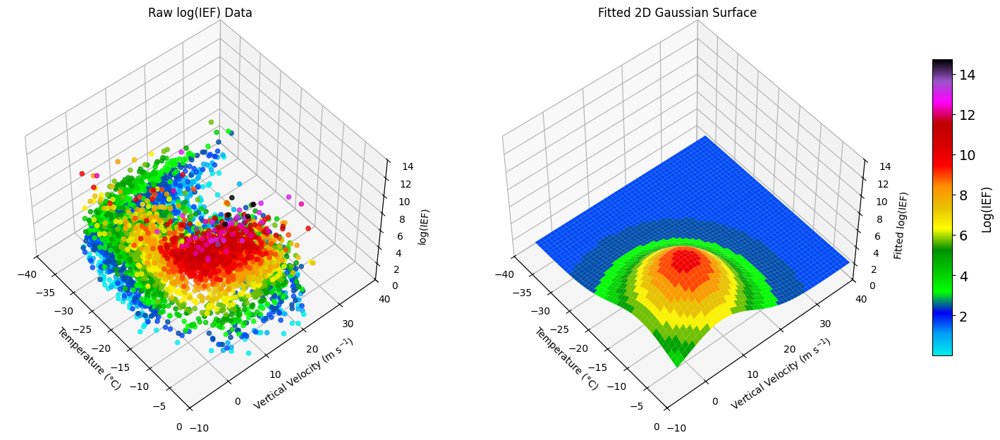

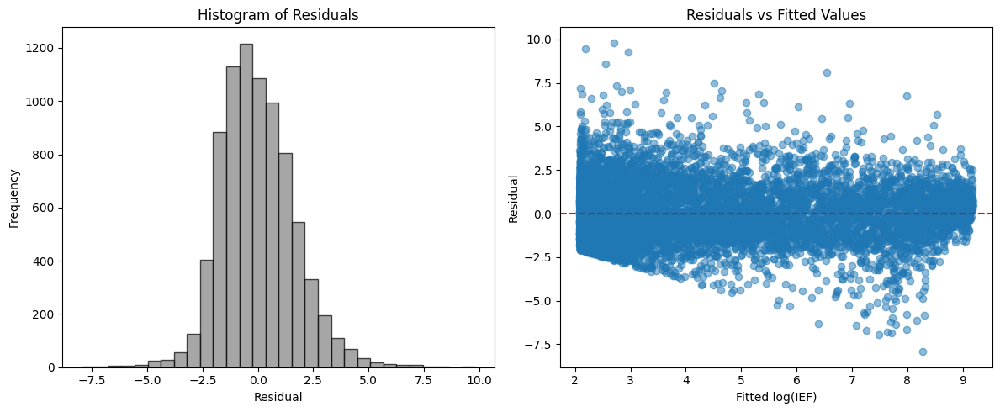

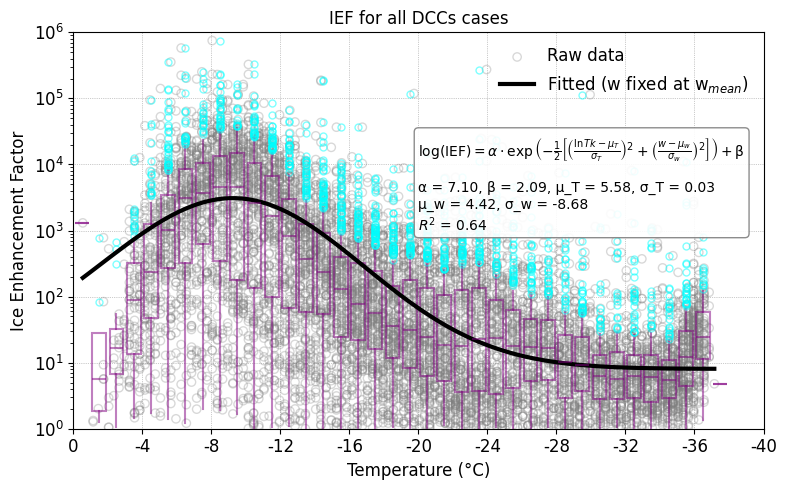

In [26]:

df_combined_tc_w = ds_combined_tc_w[['ief', 'tempc', 'wvel']].to_dataframe().dropna().reset_index()

# ---- 1. DATA PREPROCESSING ----
df_combined_tc_w['LOG_IEF'] = np.log(df_combined_tc_w['ief'])
df_combined_tc_w = df_combined_tc_w[df_combined_tc_w['ief'] >= 1]

valid_mask = (
    np.isfinite(df_combined_tc_w['LOG_IEF']) &
    np.isfinite(df_combined_tc_w['tempc']) &
    np.isfinite(df_combined_tc_w['wvel'])
)

df_ief = df_combined_tc_w[valid_mask]


T_vals = df_ief['tempc'].values
w_vals = df_ief['wvel'].values
IEF_vals = df_ief['ief'].values
log_IEF_vals = df_ief['LOG_IEF'].values
T_kelvin = T_vals + 273.16  # Temperature in Kelvin

#========== For boxplot

df_ief_tempc = pd.DataFrame({
    'T': T_vals,
    'IEF': IEF_vals
})

bin_edges = np.arange(np.floor(df_ief_tempc['T'].min()), np.ceil(df_ief_tempc['T'].max()) + 1, 1)
df_ief_tempc['T_bin'] = pd.cut(df_ief_tempc['T'], bins=bin_edges)

grouped = df_ief_tempc.groupby('T_bin')['IEF']

boxplot_tempc_ief_data = [grouped.get_group(g) for g in grouped.groups]
tempc_bin_centers = [interval.mid for interval in grouped.groups]


#========== Gaussian model

def gaussian_2d(coords, A, mu_T, sigma_T, mu_w, sigma_w, offset):
    T, w = coords
    log_T = np.log(T)
    term_T = ((log_T - mu_T) / sigma_T) ** 2
    term_w = ((w - mu_w) / sigma_w) ** 2
    return A * np.exp(-0.5 * (term_T + term_w)) + offset

def gaussian_temp_wvel_2d(coords, A, mu_T, sigma_T, mu_w, sigma_w, C):
    """Gaussian in temperature (°C), returns ln(IEF)."""
    T, w = coords
    term_T = ((T - mu_T) / sigma_T)**2.
    term_w = ((w - mu_w) / sigma_w)**2.
    return A * np.exp(-0.5 * (term_T + term_w) + C)

#========== Prepare data
# Build dataframe
df_combined_tc_w['LOG_IEF'] = np.log(df_combined_tc_w['ief'])
df_ief_all_cases = df_combined_tc_w


df_ief_filt_all_cases = df_ief_all_cases[df_ief_all_cases['ief'] >= 1]

# Group by temperature
grouped_ief_all_cases = df_ief_filt_all_cases.groupby('tempc')['ief']
grouped_ief_log_all_cases = df_ief_filt_all_cases.groupby('tempc')['LOG_IEF']

# Statistics
ief_mean_all_cases = grouped_ief_all_cases.mean()
ief_median_all_cases = grouped_ief_all_cases.median()
ief_log_mean_all_cases = grouped_ief_log_all_cases.mean()
ief_log_median_all_cases = grouped_ief_log_all_cases.median()   
ief_std_dev_all_cases = grouped_ief_all_cases.std()
ief_std_err_all_cases = grouped_ief_all_cases.sem()

ief_q25_all_cases = grouped_ief_all_cases.quantile(0.25)
ief_q75_all_cases = grouped_ief_all_cases.quantile(0.75)
ief_lower_err_all_cases = ief_median_all_cases - ief_q25_all_cases
ief_upper_err_all_cases = ief_q75_all_cases - ief_median_all_cases

# Prepare bins
temp_sorted_all_cases = sorted(grouped_ief_all_cases.groups.keys(), reverse=True)
temp_log_sorted_all_cases = sorted(grouped_ief_log_all_cases.groups.keys(), reverse=True)
data_per_bin_all_cases = [grouped_ief_all_cases.get_group(t) for t in temp_sorted_all_cases]
data_log_per_bin_all_cases = [grouped_ief_log_all_cases.get_group(t) for t in temp_log_sorted_all_cases]


#========== Fitting parameters

p0 = [
    max(log_IEF_vals),            # A
    np.mean(np.log(T_kelvin)),    # mu_T
    1.0,                          # sigma_T
    np.mean(w_vals),              # mu_w
    1.0,                          # sigma_w
    np.min(log_IEF_vals)          # offset
]

params, cov = curve_fit(
    gaussian_2d,
    (T_kelvin, w_vals),
    log_IEF_vals,
    p0=p0,
    maxfev=10000
)

A_fit, mu_T_fit, sigma_T_fit, mu_w_fit, sigma_w_fit, offset_fit = params
perr = np.sqrt(np.diag(cov))

# ---- 4. METRICS ----
log_IEF_fit = gaussian_2d((T_kelvin, w_vals), *params)
residuals = log_IEF_vals - log_IEF_fit
ss_res = np.sum(residuals**2)
ss_tot = np.sum((log_IEF_vals - np.mean(log_IEF_vals))**2)
r2 = 1 - (ss_res / ss_tot)


#====================================================
# Fitted parameters
#====================================================

#print("Fitted parameters:")
#print(f"A = {A_fit:.3f} ± {perr[0]:.3f}")
#print(f"mu_T = {mu_T_fit:.3f} ± {perr[1]:.3f}")
#print(f"sigma_T = {sigma_T_fit:.3f} ± {perr[2]:.3f}")
#print(f"mu_w = {mu_w_fit:.3f} ± {perr[3]:.3f}")
#print(f"sigma_w = {sigma_w_fit:.3f} ± {perr[4]:.3f}")
#print(f"offset = {offset_fit:.3f} ± {perr[5]:.3f}")
#print(f"R² = {r2:.3f}")

# ---- 5. 3D PLOT WITH SHARED COLORBAR ----
T_grid = np.linspace(np.min(T_kelvin), np.max(T_kelvin), 50)
w_grid = np.linspace(np.min(w_vals), np.max(w_vals), 50)
T_mesh, w_mesh = np.meshgrid(T_grid, w_grid)
log_IEF_mesh = gaussian_2d((T_mesh, w_mesh), *params)

vmin = min(np.min(log_IEF_vals), np.min(log_IEF_mesh))
vmax = max(np.max(log_IEF_vals), np.max(log_IEF_mesh))
norm = colors.Normalize(vmin=vmin, vmax=vmax)
cmap = plt.get_cmap('pyart_NWSRef') #coolwarm, HomeyerRainbow, pyart_NWSRef, RdBu_r
sm = ScalarMappable(norm=norm, cmap=cmap)


fnt = 12
ln = 2
wd = 0.8
ln1 = 1.5
al1 = 0.5
al2 = 0.5
fig = plt.figure(figsize=(14, 6))

#====================================================
# Raw data
#====================================================

ax1 = fig.add_subplot(121, projection='3d')
levels = np.linspace(0, 14, 20)
norm = colors.BoundaryNorm(boundaries=levels, ncolors=256)
sc = ax1.scatter(T_vals, w_vals, log_IEF_vals, c=log_IEF_vals, cmap=cmap, norm=norm, alpha=0.8)

ax1.set_xlim(0, -40)
ax1.set_ylim(-10, 40)
ax1.set_zlim(0, 14)

ax1.view_init(elev=50, azim=320)
ax1.invert_xaxis()

ax1.set_xlabel('Temperature (°C)')
ax1.set_ylabel('Vertical Velocity (m s$^{-1}$)')
ax1.set_zlabel('log(IEF)')
ax1.set_title('Raw log(IEF) Data')

#====================================================
# Fitted Gaussian surface
#====================================================

ax2 = fig.add_subplot(122, projection='3d')
surf = ax2.plot_surface(T_mesh - 273.16, w_mesh, log_IEF_mesh, cmap=cmap, norm=norm, alpha=1)

ax2.set_xlim(0, -40)
ax2.set_ylim(-10, 40)
ax2.set_zlim(0, 14)

ax2.view_init(elev=50, azim=320)
ax2.invert_xaxis()

ax2.set_xlabel('Temperature (°C)')
ax2.set_ylabel('Vertical Velocity (m s$^{-1}$)')
ax2.set_zlabel('Fitted log(IEF)')
ax2.set_title('Fitted 2D Gaussian Surface')

cbar_ax = fig.add_axes([1.0, 0.15, 0.02, 0.7])  # [left, bottom, width, height]

cbar1 = fig.colorbar(sm, cax=cbar_ax, orientation='vertical', ticks=[0, 2, 4, 6, 8, 10, 12, 14])
cbar1.set_label('Log(IEF)', fontsize=fnt)
cbar1.ax.tick_params(labelsize=fnt + 2)

plt.tight_layout()
plt.show()


#====================================================
# Residual plot
#====================================================

fig, axs = plt.subplots(1, 2, figsize=(12, 5))

axs[0].hist(residuals, bins=30, color='gray', edgecolor='black', alpha=0.7)
axs[0].set_title('Histogram of Residuals')
axs[0].set_xlabel('Residual')
axs[0].set_ylabel('Frequency')

axs[1].scatter(log_IEF_fit, residuals, alpha=0.5)
axs[1].axhline(0, color='red', linestyle='--')
axs[1].set_title('Residuals vs Fitted Values')
axs[1].set_xlabel('Fitted log(IEF)')
axs[1].set_ylabel('Residual')

plt.tight_layout()
plt.show()


#====================================================
# 2D slice for IEF versus temperature plot
# w is fixed at w_mean
#====================================================
def predict_log_IEF(T_celsius, w, params):
    T_kelvin = T_celsius + 273.16
    return gaussian_2d((T_kelvin, w), *params)
    #return gaussian_2d((T_celsius, w), *params)

def predict_IEF(T_celsius, w, params):
    return np.exp(predict_log_IEF(T_celsius, w, params))

plt.figure(figsize=(8, 5))

plt.boxplot(boxplot_tempc_ief_data,
            positions=tempc_bin_centers,
            vert=True, patch_artist=True, widths=wd,
            boxprops=dict(facecolor='none', edgecolor='purple', linewidth=ln1, alpha=al2),
            medianprops=dict(color='purple', linewidth=ln1, alpha=al2),
            whiskerprops=dict(linewidth=ln1, color='purple', alpha=al2),
            capprops=dict(linewidth=ln1, color='none', alpha=al2),
            flierprops=dict(marker='o', markerfacecolor='None', markeredgecolor='cyan',
                            markersize=5, alpha=al2),
            showfliers=True)

plt.scatter(T_vals, IEF_vals, color='gray', facecolor='none', edgecolor='gray', alpha=0.3, label='Raw data')

T_vals_plot = np.linspace(np.min(T_vals), np.max(T_vals), 100)
w_mean = np.mean(w_vals)
fitted_curve = predict_IEF(T_vals_plot, np.full_like(T_vals_plot, w_mean), params)

plt.plot(T_vals_plot, fitted_curve, 'k-', linewidth=3, label='Fitted (w fixed at w$_{mean}$)') #{w_mean:.2f} m/s)')

eq_text = (
    r"$\log(\mathrm{IEF}) = \alpha \cdot \exp\left(-\frac{1}{2} \left[ \left(\frac{\ln Tk - \mu_T}{\sigma_T}\right)^2"
    r" + \left(\frac{w - \mu_w}{\sigma_w}\right)^2 \right]\right) + \mathrm{\beta}$" + "\n\n" +
    f"\u03B1 = {A_fit:.2f}, \u03B2 = {offset_fit:.2f}, \u00B5_T = {mu_T_fit:.2f}, \u03C3_T = {sigma_T_fit:.2f}\n"
    f"\u00B5_w = {mu_w_fit:.2f}, \u03C3_w = {sigma_w_fit:.2f}\n"
    f"$R^2$ = {r2:.2f}"
)

plt.text(
    0.5, 0.5, eq_text,
    transform=plt.gca().transAxes,
    fontsize=10,
    bbox=dict(boxstyle="round", fc="w", ec="0.5", alpha=0.9)
)

plt.yscale('log')
plt.xlim(0., -40.)
plt.xticks(ticks=[0, -4, -8, -12, -16, -20, -24, -28, -32, -36, -40],
           labels=[str(x) for x in [0, -4, -8, -12, -16, -20, -24, -28, -32, -36, -40]],
           fontsize=fnt)

plt.yscale('log')
plt.ylim(1.0, 1.e6)
plt.yticks(fontsize=fnt)
plt.xlabel('Temperature (°C)', fontsize=fnt)
plt.ylabel('Ice Enhancement Factor', fontsize=fnt)
plt.title('IEF for all DCCs cases', fontsize=fnt)
plt.legend(frameon=False, fontsize=fnt)

plt.grid(True, linestyle=':', linewidth=0.5, color='grey', alpha=0.8)

plt.tight_layout()
plt.show()


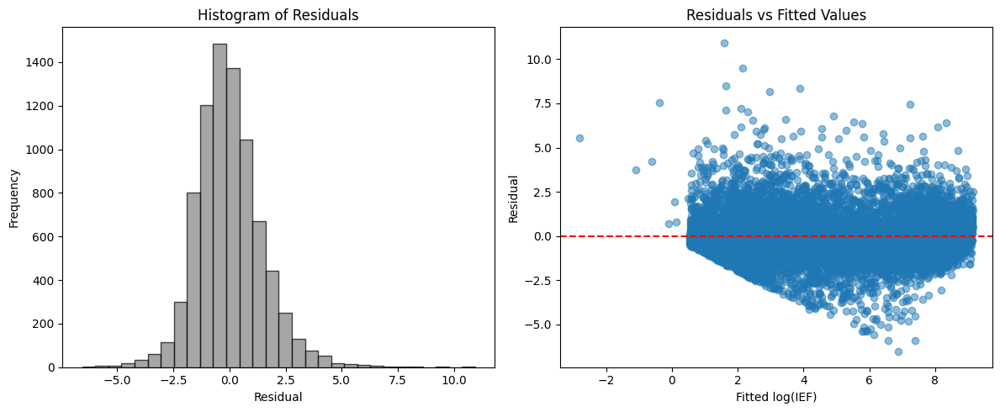

Polynomial surface R²: 0.72


In [122]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression

df_combined_tc_w = ds_combined_tc_w[['ief', 'tempc', 'wvel']].to_dataframe().dropna().reset_index()

# Omit log(ief) values smaller than 1
df_combined_tc_w['LOG_IEF'] = np.log(df_combined_tc_w['ief'])
df_combined_tc_w = df_combined_tc_w[df_combined_tc_w['ief'] >= 1]

valid_mask = (
    np.isfinite(df_combined_tc_w['LOG_IEF']) &
    np.isfinite(df_combined_tc_w['tempc']) &
    np.isfinite(df_combined_tc_w['wvel'])
)

df_ief = df_combined_tc_w[valid_mask]

T_vals = df_ief['tempc'].values
w_vals = df_ief['wvel'].values
IEF_vals = df_ief['ief'].values
log_IEF_vals = df_ief['LOG_IEF'].values
T_kelvin = T_vals + 273.16  

#================================
# Prepare data
#================================

x_tempc_w = np.column_stack([T_vals, w_vals]) # predictors: Temperature, Vertical Velocity
log_ief  = log_IEF_vals                       # response: log(IEF)

#================================
# Decide degree of polynomial
#================================
poly = PolynomialFeatures(degree=4, include_bias=False)
tempc_w_poly = poly.fit_transform(x_tempc_w)

#====== Regression fit
model = LinearRegression()
model.fit(tempc_w_poly, log_ief)

#====== Get predictions
log_ief_fit = model.predict(tempc_w_poly)


#=======================================
# Calculate R2 and residuals
#=======================================

def evaluate_fit(log_IEF_vals, log_ief_fit):
    residuals = log_IEF_vals - log_ief_fit
    ss_res = np.sum(residuals**2)
    ss_tot = np.sum((log_IEF_vals - np.mean(log_IEF_vals))**2)
    r2 = 1 - (ss_res / ss_tot)

    # Residual plots
    fig, axs = plt.subplots(1, 2, figsize=(12, 5))

    axs[0].hist(residuals, bins=30, color='gray', edgecolor='black', alpha=0.7)
    axs[0].set_title("Histogram of Residuals")
    axs[0].set_xlabel("Residual")
    axs[0].set_ylabel("Frequency")

    axs[1].scatter(y_fit, residuals, alpha=0.5)
    axs[1].axhline(0, color='red', linestyle='--')
    axs[1].set_title("Residuals vs Fitted Values")
    axs[1].set_xlabel("Fitted log(IEF)")
    axs[1].set_ylabel("Residual")

    plt.tight_layout()
    plt.show()

    return r2, residuals

r2_poly, residuals_poly = evaluate_fit(y, y_fit)
print(f"Polynomial surface R²: {r2_poly:.2f}")


## Polynomial fit

Polynomial surface R² = 0.72


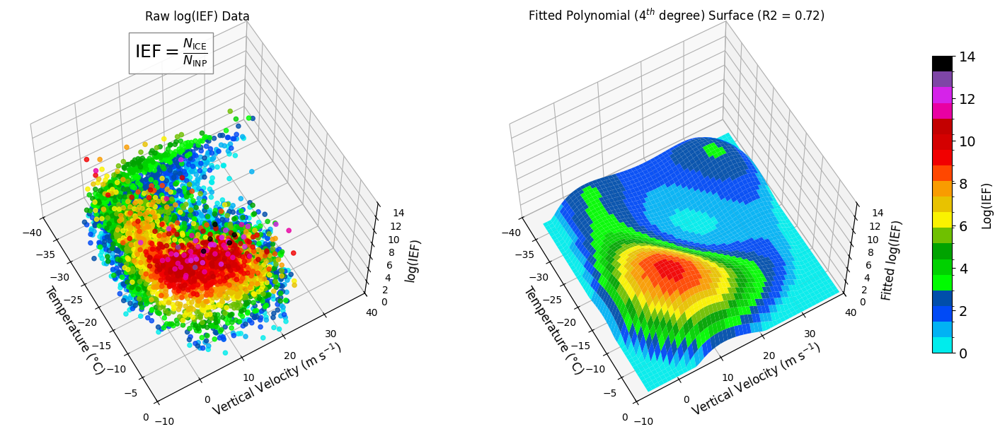

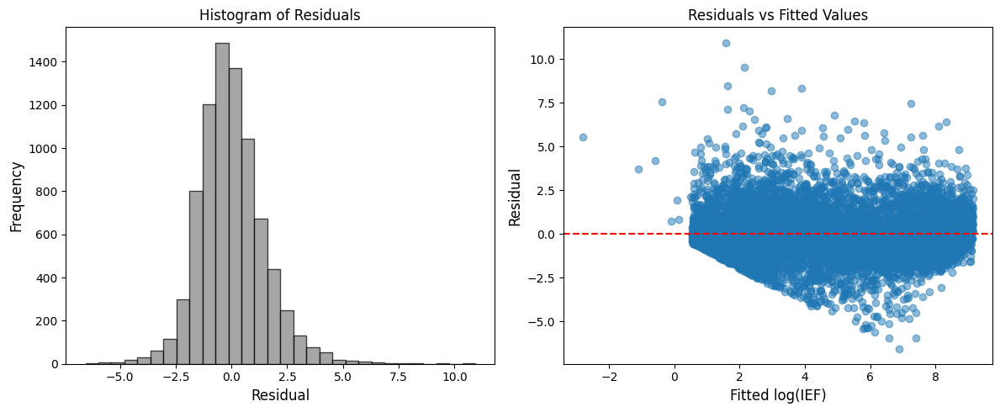

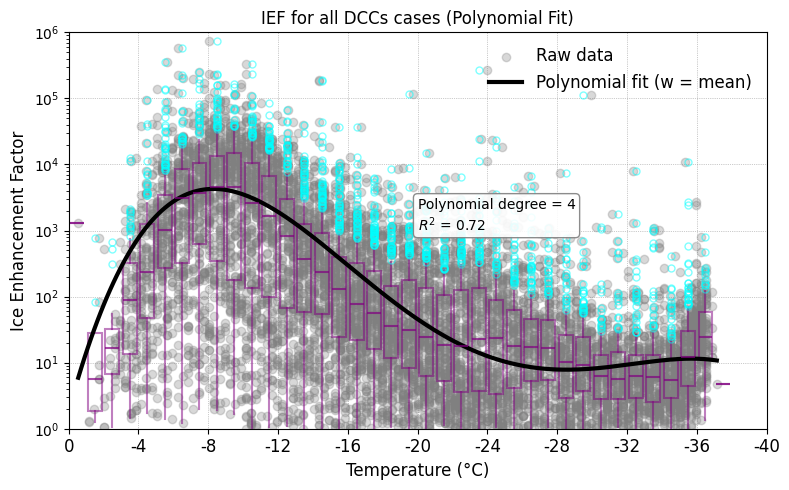

In [51]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import colors
from matplotlib.cm import ScalarMappable
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression

df_combined_tc_w = ds_combined_tc_w[['ief', 'tempc', 'wvel']].to_dataframe().dropna().reset_index()

# Omit log(ief) values smaller than 1
df_combined_tc_w['LOG_IEF'] = np.log(df_combined_tc_w['ief'])
df_combined_tc_w = df_combined_tc_w[df_combined_tc_w['ief'] >= 1]

valid_mask = (
    np.isfinite(df_combined_tc_w['LOG_IEF']) &
    np.isfinite(df_combined_tc_w['tempc']) &
    np.isfinite(df_combined_tc_w['wvel'])
)

df_ief = df_combined_tc_w[valid_mask]

T_vals = df_ief['tempc'].values
w_vals = df_ief['wvel'].values
IEF_vals = df_ief['ief'].values
log_IEF_vals = df_ief['LOG_IEF'].values
T_kelvin = T_vals + 273.16  

#================================
# Prepare data
#================================

x_tempc_w = np.column_stack([T_vals, w_vals]) # predictors: Temperature, Vertical Velocity
log_ief  = log_IEF_vals                       # response: log(IEF)

#================================
# Decide degree of polynomial
#================================
poly = PolynomialFeatures(degree=4, include_bias=False)
tempc_w_poly = poly.fit_transform(x_tempc_w)

#====== Regression fit
model = LinearRegression()
model.fit(tempc_w_poly, log_ief)

#====== Get predictions
log_ief_fit = model.predict(tempc_w_poly)

# ====================================================
# 3. R² AND RESIDUALS
# ====================================================
residuals = log_IEF_vals - log_ief_fit
ss_res = np.sum(residuals**2)
ss_tot = np.sum((log_IEF_vals - np.mean(log_ief_fit))**2)
r2 = 1 - (ss_res / ss_tot)
print(f"Polynomial surface R² = {r2:.2f}")

# ====================================================
# 4. 3D PLOT: RAW VS FITTED
# ====================================================
T_grid = np.linspace(np.min(T_vals), np.max(T_vals), 50)
w_grid = np.linspace(np.min(w_vals), np.max(w_vals), 50)
T_mesh, w_mesh = np.meshgrid(T_grid, w_grid)
X_mesh = np.column_stack([T_mesh.ravel(), w_mesh.ravel()])
X_mesh_poly = poly.transform(X_mesh)
log_ief_mesh_fit = model.predict(X_mesh_poly).reshape(T_mesh.shape)

log_ief_mesh_fit[log_ief_mesh_fit < 0.] = 0.#np.nan

# Color normalization
vmin = min(np.nanmin(log_IEF_vals), np.nanmin(log_ief_mesh_fit))
vmax = max(np.nanmax(log_IEF_vals), np.nanmax(log_ief_mesh_fit))
norm = colors.Normalize(vmin=vmin, vmax=vmax)
cmap = plt.get_cmap('pyart_NWSRef') #coolwarm, HomeyerRainbow, pyart_NWSRef, RdBu_r
sm = ScalarMappable(norm=norm, cmap=cmap)

fig = plt.figure(figsize=(14, 6))

# Raw data
ax1 = fig.add_subplot(121, projection='3d')
levels = np.linspace(0, 14, 20)
norm = colors.BoundaryNorm(boundaries=levels, ncolors=256)
sm = ScalarMappable(norm=norm, cmap=cmap)
sm.set_array(y)
sc = ax1.scatter(T_vals, w_vals, log_IEF_vals, c=log_IEF_vals, cmap=cmap, norm=norm, alpha=0.8)
ax1.set_xlim(0, -40)
ax1.set_ylim(-10, 40)
ax1.set_zlim(0, 14)#np.min(y), np.max(y))
#ax1.view_init(elev=50, azim=320)
#ax1.view_init(elev=30, azim=150)
ax1.view_init(elev=60, azim=150)
#ax1.invert_xaxis()
ax1.invert_yaxis()
ax1.set_xlabel('Temperature (°C)', fontsize=fnt)
ax1.set_ylabel('Vertical Velocity (m s$^{-1}$)', fontsize=fnt)
ax1.set_zlabel('log(IEF)', fontsize=fnt)
ax1.set_title('Raw log(IEF) Data', fontsize=fnt)



eq_text = r"$\mathrm{IEF} = \frac{N_{\mathrm{ICE}}}{N_{\mathrm{INP}}}$"

ax1.text2D(
    0.02, 0.8, eq_text,
    transform=ax.transAxes,
    fontsize=18,
    bbox=dict(boxstyle="square", fc="w", ec="0.5", alpha=0.9))


# Fitted surface
ax2 = fig.add_subplot(122, projection='3d')
levels = np.linspace(0, 14, 20)
norm = colors.BoundaryNorm(boundaries=levels, ncolors=256)
sm = ScalarMappable(norm=norm, cmap=cmap)
sm.set_array(log_ief_mesh_fit)
surf = ax2.plot_surface(T_mesh, w_mesh, log_ief_mesh_fit, cmap=cmap, norm=norm, alpha=0.95)
ax2.set_xlim(0, -40)
ax2.set_ylim(-10, 40)
ax2.set_zlim(0, 14)#np.nanmin(y_mesh_fit), np.nanmax(y_mesh_fit))
#ax2.view_init(elev=50, azim=320)
#ax2.view_init(elev=30, azim=150)
ax2.view_init(elev=60, azim=150)

#ax2.invert_xaxis()
ax2.invert_yaxis()
ax2.set_xlabel('Temperature (°C)', fontsize=fnt)
ax2.set_ylabel('Vertical Velocity (m s$^{-1}$)', fontsize=fnt)
ax2.set_zlabel('Fitted log(IEF)', fontsize=fnt)
ax2.set_title(f"Fitted Polynomial ($4^{{th}}$ degree) Surface (R2 = {r2:.2f})", fontsize=fnt)

#f"Polynomial surface R² = {r2:.2f}"
# Shared colorbar
cbar_ax = fig.add_axes([1.0, 0.15, 0.02, 0.7])  # [left, bottom, width, height]

cbar1 = fig.colorbar(sm, cax=cbar_ax, orientation='vertical', ticks=[0, 2, 4, 6, 8, 10, 12, 14])
cbar1.set_label('Log(IEF)', fontsize=fnt)
cbar1.ax.tick_params(labelsize=fnt + 2)

plt.tight_layout()
plt.show()

# ====================================================
# 5. RESIDUAL DIAGNOSTICS
# ====================================================
fig, axs = plt.subplots(1, 2, figsize=(12, 5))

axs[0].hist(residuals, bins=30, color='gray', edgecolor='black', alpha=0.7)
axs[0].set_title('Histogram of Residuals', fontsize=fnt)
axs[0].set_xlabel('Residual', fontsize=fnt)
axs[0].set_ylabel('Frequency', fontsize=fnt)

axs[1].scatter(log_ief_fit, residuals, alpha=0.5)
axs[1].axhline(0, color='red', linestyle='--')
axs[1].set_title('Residuals vs Fitted Values', fontsize=fnt)
axs[1].set_xlabel('Fitted log(IEF)', fontsize=fnt)
axs[1].set_ylabel('Residual', fontsize=fnt)

plt.tight_layout()
plt.show()

# ====================================================
# 6. SLICE PLOT: IEF VS TEMPERATURE (BOXPLOT + FIT)
# ====================================================
def predict_log_IEF_poly(T_celsius, w, model, poly):
    X_input = np.column_stack([T_celsius, w])
    X_input_poly = poly.transform(X_input)
    return model.predict(X_input_poly)

def predict_IEF_poly(T_celsius, w, model, poly):
    return np.exp(predict_log_IEF_poly(T_celsius, w, model, poly))

plt.figure(figsize=(8, 5))

# Boxplot of IEF vs Temperature bins
plt.boxplot(boxplot_tempc_ief_data,
            positions=tempc_bin_centers,
            vert=True, patch_artist=True, widths=0.8,
            boxprops=dict(facecolor='none', edgecolor='purple', linewidth=1.5, alpha=0.5),
            medianprops=dict(color='purple', linewidth=1.5, alpha=0.7),
            whiskerprops=dict(linewidth=1.5, color='purple', alpha=0.5),
            capprops=dict(linewidth=1.5, color='none', alpha=0.5),
            flierprops=dict(marker='o', markerfacecolor='None', markeredgecolor='cyan',
                            markersize=5, alpha=0.5),
            showfliers=True)

# Raw scatter
plt.scatter(T_vals, IEF_vals, color='gray', edgecolor='gray', alpha=0.3, label='Raw data')

# Polynomial fitted curve at mean w
T_vals_plot = np.linspace(np.min(T_vals), np.max(T_vals), 200)
w_mean = np.mean(w_vals)
fitted_curve = predict_IEF_poly(T_vals_plot, np.full_like(T_vals_plot, w_mean), model, poly)

plt.plot(T_vals_plot, fitted_curve, 'k-', linewidth=3, label='Polynomial fit (w = mean)')

# Annotation
eq_text = f"Polynomial degree = 4\n$R^2$ = {r2:.2f}"
plt.text(0.5, 0.5, eq_text,
         transform=plt.gca().transAxes,
         fontsize=10,
         bbox=dict(boxstyle="round", fc="w", ec="0.5", alpha=0.9))



# Axes settings
plt.yscale('log')
plt.xlim(0., -40.)
plt.xticks(ticks=[0, -4, -8, -12, -16, -20, -24, -28, -32, -36, -40],
           labels=[str(x) for x in [0, -4, -8, -12, -16, -20, -24, -28, -32, -36, -40]],
           fontsize=12)

plt.ylim(1.0, 1.e6)
plt.xlabel('Temperature (°C)', fontsize=fnt)
plt.ylabel('Ice Enhancement Factor', fontsize=fnt)
plt.title('IEF for all DCCs cases (Polynomial Fit)', fontsize=fnt)
plt.legend(frameon=False, fontsize=fnt)
plt.grid(True, linestyle=':', linewidth=0.5, color='grey', alpha=0.8)


#================= Eqn
#coefs = model.coef_
#intercept = model.intercept_
coefs = model.coef_
intercept = model.intercept_
feature_names = poly.get_feature_names_out(['Tc', 'w'])
coef = model.coef_
intercept = model.intercept_

# Build polynomial equation string
terms = [f"{intercept:.3f}"]  # constant term first
for coef, name in zip(coefs, feature_names):
    sign = "+" if coef >= 0 else "-"
    terms.append(f" {sign} {abs(coef):.3f}*{name}")

# Combine into one string
poly_eq = "log(IEF) = " + "".join(terms)

eq_text = f"Polynomial degree = 4\n$R^2$ = {r2:.2f}\n\n{poly_eq}"
#plt.text(0.5, 0.5, eq_text,
#         transform=plt.gca().transAxes,
#         fontsize=8,
#         bbox=dict(boxstyle="round", fc="w", ec="0.5", alpha=0.9))




plt.tight_layout()
plt.show()


In [46]:
# Get coefficients and intercept
coefs = model.coef_
intercept = model.intercept_

# Build polynomial equation string
terms = [f"{intercept:.3f}"]  # constant term first
for coef, name in zip(coefs, feature_names):
    sign = "+" if coef >= 0 else "-"
    terms.append(f" {sign} {abs(coef):3.8f}*{name}")

# Combine into one string
poly_eq = "log(IEF) = " + "".join(terms)
print(poly_eq)
for name, coef in zip(feature_names, coefs):
    print(f"{name}: {coef:3.8f}")


log(IEF) = -6.981 - 3.32833621*Tc + 1.65798956*w - 0.24566025*Tc^2 + 0.14860255*Tc w - 0.11870261*w^2 - 0.00683514*Tc^3 + 0.00475715*Tc^2 w - 0.00380070*Tc w^2 + 0.00330370*w^3 - 0.00006595*Tc^4 + 0.00004768*Tc^3 w - 0.00005020*Tc^2 w^2 + 0.00002644*Tc w^3 - 0.00003568*w^4
Tc: -3.32833621
w: 1.65798956
Tc^2: -0.24566025
Tc w: 0.14860255
w^2: -0.11870261
Tc^3: -0.00683514
Tc^2 w: 0.00475715
Tc w^2: -0.00380070
w^3: 0.00330370
Tc^4: -0.00006595
Tc^3 w: 0.00004768
Tc^2 w^2: -0.00005020
Tc w^3: 0.00002644
w^4: -0.00003568


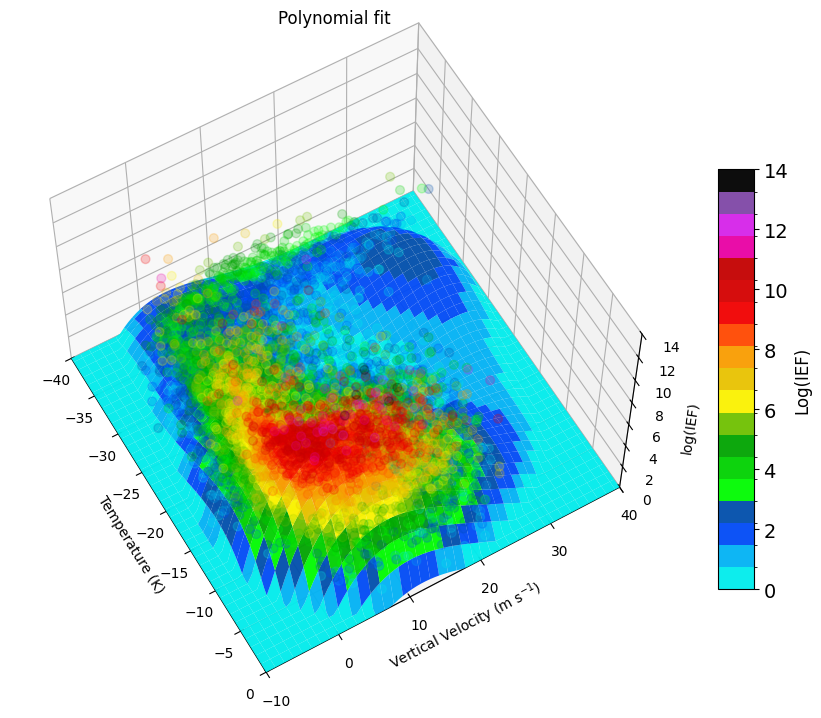

In [125]:
temp_bin = np.linspace(0, -40, 80)  # 20 points from 0 to -40 °C
w_bin = np.linspace(-10, 40, 80)    # 20 points from -10 to 30 m/s

T_mesh, w_mesh = np.meshgrid(temp_bin, w_bin)
T_kelvin_mesh = T_mesh + 273.16  # Convert to Kelvin


def poly_2d_fit(tc, w):
    tk=tc;#+273.16;
    a1 = -3.57e-5; a2 = 2.64e-5; a3 = -5.0e-5; a4 = 4.77e-5; 
    a5 = -6.6e-5; a6 = 3.3e-3; a7 = -3.8e-3; a8 = 4.75e-3; 
    a9 = -6.84e-3; a10 = -1.187e-1; a11 = 1.486e-1; a12 = -0.246; 
    a13 = 1.658; a14 = -3.3284; a15 = -6.981;
    predictor = (a1 * w**4. + a2 * tk * w**3. + a3 * (tk**2.) * (w**2.) + a4 * (tk**3.) * w + a5 * tk**4. +
                 a6 * w**3. + a7 * tk * w**2. + a8 * (tk**2.) * w + a9 * tk**3. + a10 * w**2. + a11 * tk * w +
                 a12 * tk**2. + a13 * w + a14 * tk + a15)
    predictor[predictor < 0.] = 0.
    return predictor
    
#log_IEF_mesh = gaussian_2d((T_kelvin_mesh, w_mesh), *params)
log_IEF_mesh = poly_2d_fit(T_mesh, w_mesh)

log_IEF_vals[log_IEF_vals < 0.] = 0.

#print(np.nanmin(log_IEF_mesh), np.nanmax(log_IEF_mesh))

fig = plt.figure(figsize=(12, 7))

ax = fig.add_subplot(111, projection='3d')
levels = np.linspace(0, 14, 20)
norm = colors.BoundaryNorm(boundaries=levels, ncolors=256)
sm = ScalarMappable(norm=norm, cmap=cmap)
sm.set_array(log_IEF_mesh)
sc = ax.scatter(T_vals, w_vals, log_IEF_vals, c=log_IEF_vals, s=40, cmap='pyart_NWSRef', norm=norm, alpha=0.21) # coolwarm, HomeyerRainbow, pyart_NWSRef, RdBu_r
#surf = ax.plot_surface(T_mesh, w_mesh, (log_IEF_mesh), cmap='pyart_NWSRef', alpha=1)
surf = ax.plot_surface(T_mesh, w_mesh, log_IEF_mesh, cmap='pyart_NWSRef', norm=norm, alpha=0.95)


ax.set_xlim(0, -40)  
ax.set_ylim(-10, 40)

ax.view_init(elev=50, azim=240)
ax.set_xlabel('Temperature (K)')
ax.set_ylabel('Vertical Velocity (m s$^{-1}$)')
ax.set_zlabel('log(IEF)')

ax.set_xlim(0, -40)
ax.set_ylim(-10, 40)
ax.set_zlim(0, 14)
ax.invert_yaxis()
ax.view_init(elev=60, azim=150)

ax.set_title('Polynomial fit', fontsize=fnt)

cbar_ax = fig.add_axes([0.82, 0.15, 0.03, 0.6])  # [left, bottom, width, height]

cbar1 = fig.colorbar(surf, cax=cbar_ax, orientation='vertical', ticks=[0, 2, 4, 6, 8, 10, 12, 14])
cbar1.set_label('Log(IEF)', fontsize=fnt)
cbar1.ax.tick_params(labelsize=fnt + 2)

plt.tight_layout()
plt.show()




In [175]:

    
#========== Prepare data


df_combined_tc_w['LOG_IEF'] = np.log(df_combined_tc_w['ief'])
df_ief_all_cases = df_combined_tc_w

df_ief_filt_all_cases = df_ief_all_cases[df_ief_all_cases['ief'] >= 1]


grouped_ief_all_cases = df_ief_filt_all_cases.groupby(['tempc', 'wvel'])['ief']
grouped_ief_log_all_cases = df_ief_filt_all_cases.groupby(['tempc', 'wvel'])['LOG_IEF']

ief_mean_all_cases = grouped_ief_all_cases.mean()
ief_median_all_cases = grouped_ief_all_cases.median()
ief_log_mean_all_cases = grouped_ief_log_all_cases.mean()
ief_log_median_all_cases = grouped_ief_log_all_cases.median()
ief_std_dev_all_cases = grouped_ief_all_cases.std()
ief_std_err_all_cases = grouped_ief_all_cases.sem()

ief_q25_all_cases = grouped_ief_all_cases.quantile(0.25)
ief_q75_all_cases = grouped_ief_all_cases.quantile(0.75)
ief_lower_err_all_cases = ief_median_all_cases - ief_q25_all_cases
ief_upper_err_all_cases = ief_q75_all_cases - ief_median_all_cases

temp_wvel_sorted_all_cases = sorted(grouped_ief_all_cases.groups.keys(), reverse=True)
data_per_bin_all_cases = [grouped_ief_all_cases.get_group(key) for key in temp_wvel_sorted_all_cases]
#temp_wvel_log_sorted_all_cases = sorted(grouped_ief_log_all_cases.groups.keys(), reverse=True)
data_log_per_bin_all_cases = [grouped_ief_log_all_cases.get_group(key) for key in temp_wvel_sorted_all_cases]


#==============================================
# Get sorted list of (tempc and wvel) keys
#==============================================

temp_wvel_log_sorted_all_cases = sorted(grouped_ief_log_all_cases.groups.keys(), reverse=True)

x_tempc = np.array([t[0] for t in temp_wvel_log_sorted_all_cases])  # °C
x_wvel = np.array([t[1] for t in temp_wvel_log_sorted_all_cases])  # vertical velocity

#==============================================
# Get ln(ief) means per (tempc and wvel) pair
#==============================================
# Step 3: Get ln(IEF) means per (tempc, wvel) pair
y_ln_ief = np.array([ief_log_mean_all_cases[t] for t in temp_wvel_log_sorted_all_cases])

#==============================================
# Count of entries per bin (tempc, wvel)
#==============================================
n_per_bin = np.array([len(grouped_ief_log_all_cases.get_group(t)) for t in temp_wvel_log_sorted_all_cases])


#========== Gaussian model

def full_ellipse_gaussian_2d(coords, A, mu_T, mu_w, sigma_T, sigma_w, rho, offset):
    T, w = coords
    term1 = ((T - mu_T)/sigma_T)**2
    term2 = ((w - mu_w)/sigma_w)**2
    cross = 2 * rho * (T - mu_T) * (w - mu_w) / (sigma_T * sigma_w)
    z = term1 + term2 - cross
    norm = 1 / (2 * np.pi * sigma_T * sigma_w * np.sqrt(1 - rho**2))
    return A * np.exp(-z / (2*(1 - rho**2))) + offset


def gaussian_2d(coords, A, mu_T, sigma_T, mu_w, sigma_w, offset):
    T, w = coords
    log_T = np.log(T)
    term_T = ((log_T - mu_T) / sigma_T) ** 2
    term_w = ((w - mu_w) / sigma_w) ** 2
    return A * np.exp(-0.5 * (term_T + term_w)) + offset

def gaussian_temp_wvel_2d(coords, A, mu_T, sigma_T, mu_w, sigma_w, C):
    """Gaussian in temperature (°C), returns ln(IEF)."""
    T, w = coords
    term_T = ((T - mu_T) / sigma_T)**2.
    term_w = ((w - mu_w) / sigma_w)**2.
    return A * np.exp(-0.5 * (term_T + term_w) + C)


#p0 = [
#    np.max(y_ln_ief)-np.min(y_ln_ief),            # A
#    np.mean(x_tempc),    # mu_T
#    1.0,                          # sigma_T
#    np.mean(x_wvel),              # mu_w
#    1.0,                          # sigma_w
#    np.min(y_ln_ief)          # offset
#]

p0 = [
    np.max(y_ln_ief)-np.min(y_ln_ief),       # A: range instead of max-min
    np.median(x_tempc),     # mu_T: median might be better if skewed
    5.0,                    # sigma_T: tighter initial guess
    np.median(x_wvel),      # mu_w: again, median
    2.0,                    # sigma_w: smaller spread if data is tight
    0.3,
    np.min(y_ln_ief)        # offset
]

params, cov = curve_fit(
    full_ellipse_gaussian_2d,
    (x_tempc, x_wvel),
    y_ln_ief,
    p0=p0,
    maxfev=100000
)

#A_fit, mu_T_fit, sigma_T_fit, mu_w_fit, sigma_w_fit, offset_fit = params
A_fit, mu_T_fit, sigma_T_fit, mu_w_fit, sigma_w_fit, rho_fit, offset_fit = params
perr = np.sqrt(np.diag(cov))

print('alpha :: ', A_fit)
print('µ_T   :: ', mu_T_fit)
print('sig_T :: ', sigma_T_fit)
print('µ_w   :: ', mu_w_fit)
print('sig_w :: ', sigma_w_fit)
print('rho   :: ', rho_fit)
print('C_fac :: ', offset_fit)

# ---- 4. METRICS ----
log_IEF_fit = full_ellipse_gaussian_2d((x_tempc, x_wvel), *params)
residuals = y_ln_ief - log_IEF_fit
ss_res = np.sum(residuals**2)
ss_tot = np.sum((y_ln_ief - np.mean(y_ln_ief))**2)
r2 = 1 - (ss_res / ss_tot)

print(f'R2 value :: ', r2)



alpha ::  7.102533320032293
µ_T   ::  -9.860754951059455
sig_T ::  5.868036871485571
µ_w   ::  8.093642293383908
sig_w ::  8.888493763957994
rho   ::  0.4544891843974495
C_fac ::  2.0237365787554062
R2 value ::  0.6757322286407028


In [169]:
df_combined_tc_w['LOG_IEF'] = np.log(df_combined_tc_w['ief'])
df_ief_all_cases = df_combined_tc_w


df_ief_filt_all_cases = df_ief_all_cases[df_ief_all_cases['ief'] >= 1]

# Group by temperature
grouped_ief_all_cases = df_ief_filt_all_cases.groupby('tempc')['ief']
grouped_ief_log_all_cases = df_ief_filt_all_cases.groupby('tempc')['LOG_IEF']

# Statistics
ief_mean_all_cases = grouped_ief_all_cases.mean()
ief_median_all_cases = grouped_ief_all_cases.median()
ief_log_mean_all_cases = grouped_ief_log_all_cases.mean()
ief_log_median_all_cases = grouped_ief_log_all_cases.median()   
ief_std_dev_all_cases = grouped_ief_all_cases.std()
ief_std_err_all_cases = grouped_ief_all_cases.sem()

ief_q25_all_cases = grouped_ief_all_cases.quantile(0.25)
ief_q75_all_cases = grouped_ief_all_cases.quantile(0.75)
ief_lower_err_all_cases = ief_median_all_cases - ief_q25_all_cases
ief_upper_err_all_cases = ief_q75_all_cases - ief_median_all_cases

# Prepare bins
temp_sorted_all_cases = sorted(grouped_ief_all_cases.groups.keys(), reverse=True)
temp_log_sorted_all_cases = sorted(grouped_ief_log_all_cases.groups.keys(), reverse=True)
data_per_bin_all_cases = [grouped_ief_all_cases.get_group(t) for t in temp_sorted_all_cases]
data_log_per_bin_all_cases = [grouped_ief_log_all_cases.get_group(t) for t in temp_log_sorted_all_cases]
#print(temp_sorted_all_cases)

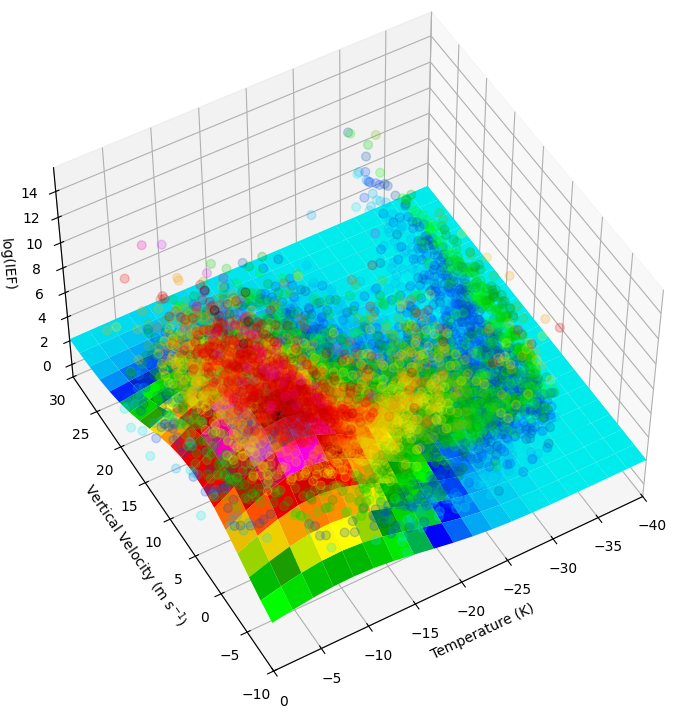

In [383]:
temp_bin = np.linspace(0, -40, 20)  # 20 points from 0 to -40 °C
w_bin = np.linspace(-10, 30, 20)    # 20 points from -10 to 30 m/s

T_mesh, w_mesh = np.meshgrid(temp_bin, w_bin)
T_kelvin_mesh = T_mesh + 273.16  # Convert to Kelvin


def gaussian_2d_fit(tc, w):
    tk = tc+273.16;
    alpha = 7.10; mu_t = 5.58; sigma_t = 0.03;
    mu_w = 4.42; sigma_w = -8.68; beta = 2.09;
    term1 = (np.log(tk)-mu_t)/sigma_t;
    term2 = (w-mu_w)/sigma_w;
    return np.exp( alpha * np.exp(-0.5*(term1**2 + term2**2)) + beta )
    
#log_IEF_mesh = gaussian_2d((T_kelvin_mesh, w_mesh), *params)
log_IEF_mesh = gaussian_2d_fit(T_mesh, w_mesh)


fig = plt.figure(figsize=(12, 7))

ax = fig.add_subplot(111, projection='3d')

sc = ax.scatter(T_vals, w_vals, log_IEF_vals, c=log_IEF_vals, s=40, cmap='pyart_NWSRef', norm=norm, alpha=0.21) # coolwarm, HomeyerRainbow, pyart_NWSRef, RdBu_r
surf = ax.plot_surface(T_mesh, w_mesh, np.log(log_IEF_mesh), cmap='pyart_NWSRef', alpha=1)

ax.set_xlim(0, -40)  
ax.set_ylim(-10, 30)

ax.view_init(elev=50, azim=240)
ax.set_xlabel('Temperature (K)')
ax.set_ylabel('Vertical Velocity (m s$^{-1}$)')
ax.set_zlabel('log(IEF)')

plt.tight_layout()
plt.show()




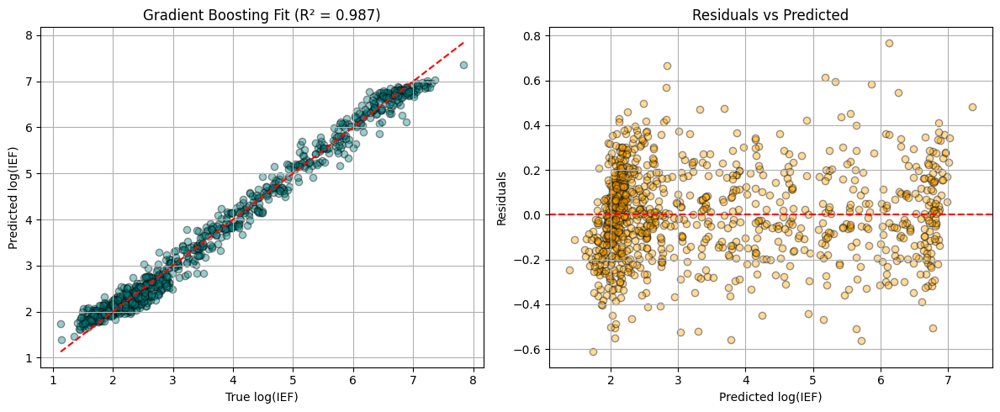

R² of Gradient Boosting Regressor: 0.987


In [141]:

import numpy as np
import pandas as pd
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.metrics import r2_score
import matplotlib.pyplot as plt
from matplotlib import cm

# Simulated data (replace with your real data)
np.random.seed(42)
n_samples = 1000
T_celsius = np.random.uniform(-40, 0, n_samples)
T_kelvin = T_celsius + 273.16
w_vals = np.random.uniform(-10, 30, n_samples)

# Simulated log(IEF) based on Gaussian-like structure
true_log_IEF = (
    5 * np.exp(-0.5 * ((np.log(T_kelvin) - 5.6) / 0.4) ** 2) *
    np.exp(-0.5 * ((w_vals - 10) / 5) ** 2) + 2
)
log_IEF_vals = true_log_IEF + np.random.normal(0, 0.3, n_samples)

# === Gradient Boosting Model ===
X = np.column_stack([np.log(T_kelvin), w_vals])
y = log_IEF_vals

model = GradientBoostingRegressor(n_estimators=300, max_depth=4, learning_rate=0.05)
model.fit(X, y)
y_pred = model.predict(X)
r2_gb = r2_score(y, y_pred)

# === Plotting ===
fig = plt.figure(figsize=(12, 5))

# 1. True vs Predicted
ax1 = fig.add_subplot(121)
ax1.scatter(y, y_pred, alpha=0.4, color='teal', edgecolors='k')
ax1.plot([min(y), max(y)], [min(y), max(y)], 'r--')
ax1.set_xlabel('True log(IEF)')
ax1.set_ylabel('Predicted log(IEF)')
ax1.set_title(f'Gradient Boosting Fit (R² = {r2_gb:.3f})')
ax1.grid(True)

# 2. Residuals
residuals = y - y_pred
ax2 = fig.add_subplot(122)
ax2.scatter(y_pred, residuals, alpha=0.4, color='orange', edgecolors='k')
ax2.axhline(0, color='red', linestyle='--')
ax2.set_xlabel('Predicted log(IEF)')
ax2.set_ylabel('Residuals')
ax2.set_title('Residuals vs Predicted')
ax2.grid(True)

plt.tight_layout()
plt.show()

# Optional: print R²
print(f"R² of Gradient Boosting Regressor: {r2_gb:.3f}")


In [396]:
print(params)

[ 3.66220535e+03  1.13565240e+04  2.49559640e+02 -1.41803527e+04
 -4.75098306e+01  1.21148494e+00  7.13036116e+01  4.32675484e+00]


## Different fitting approach

axis: R²=0.971, AIC=-2444.3, BIC=-2414.9
corr: R²=0.972, AIC=-2446.7, BIC=-2412.3
mix: R²=0.972, AIC=-2440.1, BIC=-2386.1
Best model: mix


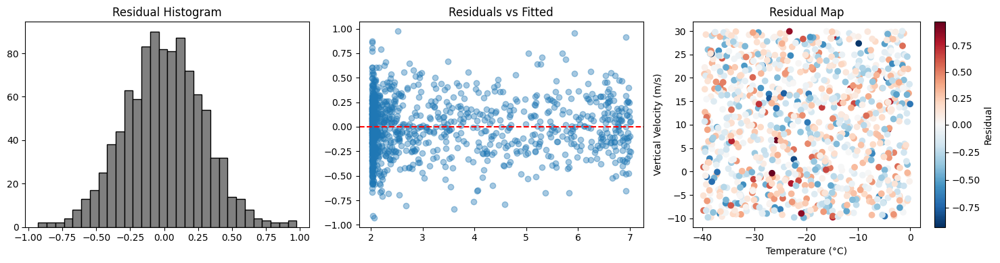

In [143]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import colors
from scipy.optimize import curve_fit, least_squares

# ===== (A) FITTING VARIANTS =====

# --- 1. Axis-aligned Gaussian (your original model) ---
def gaussian_2d(coords, A, mu_T, sigma_T, mu_w, sigma_w, offset):
    T, w = coords
    log_T = np.log(T)
    term_T = ((log_T - mu_T) / sigma_T) ** 2
    term_w = ((w - mu_w) / sigma_w) ** 2
    return A * np.exp(-0.5 * (term_T + term_w)) + offset

# --- 2. Correlated Gaussian ---
def gaussian_2d_corr(coords, A, mu_T, sigma_T, mu_w, sigma_w, rho, offset):
    logT, w = coords
    x = logT - mu_T
    y = w - mu_w
    denom = 2 * (1 - rho**2)
    z = (x**2 / sigma_T**2) + (y**2 / sigma_w**2) - (2 * rho * x * y) / (sigma_T * sigma_w)
    return A * np.exp(-z / denom) + offset

# --- 3. Mixture of two Gaussians (axis-aligned for simplicity) ---
def gaussian_component(coords, A, mu_T, sigma_T, mu_w, sigma_w):
    logT, w = coords
    x = (logT - mu_T)/sigma_T
    y = (w - mu_w)/sigma_w
    return A * np.exp(-0.5 * (x**2 + y**2))

def mixture_logIEF(coords, A1, muT1, sT1, muw1, sw1,
                   A2, muT2, sT2, muw2, sw2, offset):
    return (gaussian_component(coords, A1, muT1, sT1, muw1, sw1) +
            gaussian_component(coords, A2, muT2, sT2, muw2, sw2) + offset)

# --- Fit helper ---
def fit_model(model_fn, p0, bounds=None, robust=False):
    if robust:
        def resid(p, coords, y):
            return y - model_fn(coords, *p)
        res = least_squares(resid, p0, args=((np.log(T_kelvin), w_vals), log_IEF_vals),
                            bounds=bounds if bounds else (-np.inf, np.inf),
                            loss='soft_l1', f_scale=0.1, max_nfev=30000)
        return res.x
    else:
        params, _ = curve_fit(model_fn, (T_kelvin, w_vals), log_IEF_vals,
                              p0=p0, bounds=bounds if bounds else (-np.inf, np.inf),
                              maxfev=20000)
        return params

# Axis-aligned Gaussian
p0_axis = [max(log_IEF_vals), np.mean(np.log(T_kelvin)), 1.0,
           np.mean(w_vals), 1.0, np.min(log_IEF_vals)]
params_axis = fit_model(gaussian_2d, p0_axis)
fit_axis = gaussian_2d((T_kelvin, w_vals), *params_axis)

# Correlated Gaussian (robust)
p0_corr = [max(log_IEF_vals), np.mean(np.log(T_kelvin)), 0.8,
           np.mean(w_vals), 1.0, 0.0, np.min(log_IEF_vals)]
bounds_corr = ([0, -np.inf, 1e-6, -np.inf, 1e-6, -0.99, -np.inf],
               [np.inf, np.inf, np.inf, np.inf, np.inf, 0.99, np.inf])
params_corr = fit_model(gaussian_2d_corr, p0_corr, bounds=bounds_corr, robust=True)
fit_corr = gaussian_2d_corr((np.log(T_kelvin), w_vals), *params_corr)

# Mixture of 2 Gaussians
p0_mix = [max(log_IEF_vals)*0.7, np.mean(np.log(T_kelvin))-0.1, 0.6, np.mean(w_vals)-1.5, 1.5,
          max(log_IEF_vals)*0.3, np.mean(np.log(T_kelvin))+0.8, 0.8, np.mean(w_vals)+1.0, 2.0,
          np.min(log_IEF_vals)]
params_mix = fit_model(mixture_logIEF, p0_mix, robust=True)
fit_mix = mixture_logIEF((np.log(T_kelvin), w_vals), *params_mix)

# --- Metrics ---
def metrics(y, yfit, k):
    n = len(y)
    resid = y - yfit
    ss_res = np.sum(resid**2)
    ss_tot = np.sum((y - np.mean(y))**2)
    r2 = 1 - ss_res/ss_tot
    aic = n * np.log(ss_res/n) + 2*k
    bic = n * np.log(ss_res/n) + k*np.log(n)
    return r2, aic, bic, resid

results = {}
results['axis'] = metrics(log_IEF_vals, fit_axis, len(params_axis))
results['corr'] = metrics(log_IEF_vals, fit_corr, len(params_corr))
results['mix'] = metrics(log_IEF_vals, fit_mix, len(params_mix))

for name, (r2,aic,bic,_) in results.items():
    print(f"{name}: R²={r2:.3f}, AIC={aic:.1f}, BIC={bic:.1f}")

# ===== (B) RESIDUAL DIAGNOSTICS =====

# Pick the best model by R²
best_name = max(results, key=lambda k: results[k][0])
_, _, _, resid_best = results[best_name]
print("Best model:", best_name)

fig, axs = plt.subplots(1, 3, figsize=(15, 4))

# Histogram
axs[0].hist(resid_best, bins=30, color='gray', edgecolor='black')
axs[0].set_title('Residual Histogram')

# Residuals vs Fitted
if best_name == 'axis':
    fitted_vals = fit_axis
elif best_name == 'corr':
    fitted_vals = fit_corr
else:
    fitted_vals = fit_mix
axs[1].scatter(fitted_vals, resid_best, alpha=0.4)
axs[1].axhline(0, color='red', ls='--')
axs[1].set_title('Residuals vs Fitted')

# 2D residual heatmap (T vs w)
sc = axs[2].scatter(T_kelvin-273.16, w_vals, c=resid_best, cmap='RdBu_r',
                    norm=colors.TwoSlopeNorm(vcenter=0))
axs[2].set_xlabel('Temperature (°C)')
axs[2].set_ylabel('Vertical Velocity (m/s)')
axs[2].set_title('Residual Map')
plt.colorbar(sc, ax=axs[2], label='Residual')

plt.tight_layout()
plt.show()

axis: R²=0.971, AIC=-2444.3, BIC=-2414.9
corr: R²=0.972, AIC=-2446.7, BIC=-2412.3
mix: R²=0.972, AIC=-2440.1, BIC=-2386.1
Best model: mix


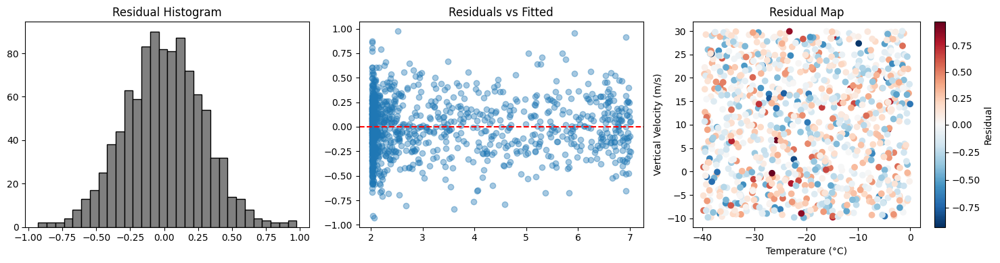

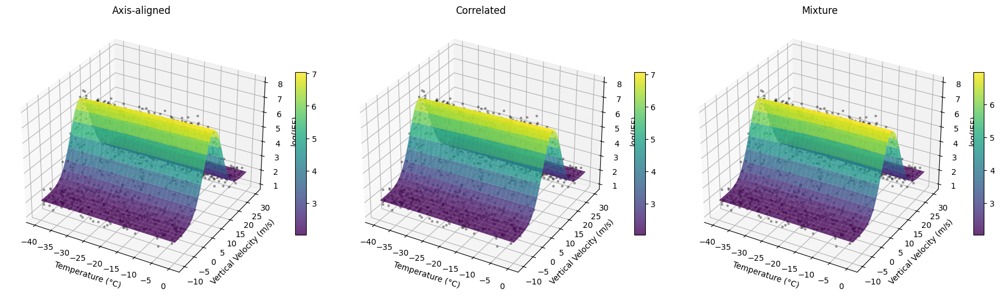

In [144]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import colors
from mpl_toolkits.mplot3d import Axes3D
from scipy.optimize import curve_fit, least_squares

# ===== (A) FITTING VARIANTS =====

# --- 1. Axis-aligned Gaussian (your original model) ---
def gaussian_2d(coords, A, mu_T, sigma_T, mu_w, sigma_w, offset):
    T, w = coords
    log_T = np.log(T)
    term_T = ((log_T - mu_T) / sigma_T) ** 2
    term_w = ((w - mu_w) / sigma_w) ** 2
    return A * np.exp(-0.5 * (term_T + term_w)) + offset

# --- 2. Correlated Gaussian ---
def gaussian_2d_corr(coords, A, mu_T, sigma_T, mu_w, sigma_w, rho, offset):
    logT, w = coords
    x = logT - mu_T
    y = w - mu_w
    denom = 2 * (1 - rho**2)
    z = (x**2 / sigma_T**2) + (y**2 / sigma_w**2) - (2 * rho * x * y) / (sigma_T * sigma_w)
    return A * np.exp(-z / denom) + offset

# --- 3. Mixture of two Gaussians ---
def gaussian_component(coords, A, mu_T, sigma_T, mu_w, sigma_w):
    logT, w = coords
    x = (logT - mu_T)/sigma_T
    y = (w - mu_w)/sigma_w
    return A * np.exp(-0.5 * (x**2 + y**2))

def mixture_logIEF(coords, A1, muT1, sT1, muw1, sw1,
                   A2, muT2, sT2, muw2, sw2, offset):
    return (gaussian_component(coords, A1, muT1, sT1, muw1, sw1) +
            gaussian_component(coords, A2, muT2, sT2, muw2, sw2) + offset)

# --- Fit helper ---
def fit_model(model_fn, p0, bounds=None, robust=False):
    if robust:
        def resid(p, coords, y):
            return y - model_fn(coords, *p)
        res = least_squares(resid, p0, args=((np.log(T_kelvin), w_vals), log_IEF_vals),
                            bounds=bounds if bounds else (-np.inf, np.inf),
                            loss='soft_l1', f_scale=0.1, max_nfev=30000)
        return res.x
    else:
        params, _ = curve_fit(model_fn, (T_kelvin, w_vals), log_IEF_vals,
                              p0=p0, bounds=bounds if bounds else (-np.inf, np.inf),
                              maxfev=20000)
        return params

# Axis-aligned Gaussian
p0_axis = [max(log_IEF_vals), np.mean(np.log(T_kelvin)), 1.0,
           np.mean(w_vals), 1.0, np.min(log_IEF_vals)]
params_axis = fit_model(gaussian_2d, p0_axis)
fit_axis = gaussian_2d((T_kelvin, w_vals), *params_axis)

# Correlated Gaussian (robust)
p0_corr = [max(log_IEF_vals), np.mean(np.log(T_kelvin)), 0.8,
           np.mean(w_vals), 1.0, 0.0, np.min(log_IEF_vals)]
bounds_corr = ([0, -np.inf, 1e-6, -np.inf, 1e-6, -0.99, -np.inf],
               [np.inf, np.inf, np.inf, np.inf, np.inf, 0.99, np.inf])
params_corr = fit_model(gaussian_2d_corr, p0_corr, bounds=bounds_corr, robust=True)
fit_corr = gaussian_2d_corr((np.log(T_kelvin), w_vals), *params_corr)

# Mixture of 2 Gaussians
p0_mix = [max(log_IEF_vals)*0.7, np.mean(np.log(T_kelvin))-0.1, 0.6, np.mean(w_vals)-1.5, 1.5,
          max(log_IEF_vals)*0.3, np.mean(np.log(T_kelvin))+0.8, 0.8, np.mean(w_vals)+1.0, 2.0,
          np.min(log_IEF_vals)]
params_mix = fit_model(mixture_logIEF, p0_mix, robust=True)
fit_mix = mixture_logIEF((np.log(T_kelvin), w_vals), *params_mix)

# --- Metrics ---
def metrics(y, yfit, k):
    n = len(y)
    resid = y - yfit
    ss_res = np.sum(resid**2)
    ss_tot = np.sum((y - np.mean(y))**2)
    r2 = 1 - ss_res/ss_tot
    aic = n * np.log(ss_res/n) + 2*k
    bic = n * np.log(ss_res/n) + k*np.log(n)
    return r2, aic, bic, resid

results = {}
results['axis'] = metrics(log_IEF_vals, fit_axis, len(params_axis))
results['corr'] = metrics(log_IEF_vals, fit_corr, len(params_corr))
results['mix'] = metrics(log_IEF_vals, fit_mix, len(params_mix))

for name, (r2,aic,bic,_) in results.items():
    print(f"{name}: R²={r2:.3f}, AIC={aic:.1f}, BIC={bic:.1f}")

# ===== (B) RESIDUAL DIAGNOSTICS =====

best_name = max(results, key=lambda k: results[k][0])
_, _, _, resid_best = results[best_name]
print("Best model:", best_name)

fig, axs = plt.subplots(1, 3, figsize=(15, 4))
axs[0].hist(resid_best, bins=30, color='gray', edgecolor='black')
axs[0].set_title('Residual Histogram')

if best_name == 'axis':
    fitted_vals = fit_axis
elif best_name == 'corr':
    fitted_vals = fit_corr
else:
    fitted_vals = fit_mix
axs[1].scatter(fitted_vals, resid_best, alpha=0.4)
axs[1].axhline(0, color='red', ls='--')
axs[1].set_title('Residuals vs Fitted')

sc = axs[2].scatter(T_kelvin-273.16, w_vals, c=resid_best, cmap='RdBu_r',
                    norm=colors.TwoSlopeNorm(vcenter=0))
axs[2].set_xlabel('Temperature (°C)')
axs[2].set_ylabel('Vertical Velocity (m/s)')
axs[2].set_title('Residual Map')
plt.colorbar(sc, ax=axs[2], label='Residual')
plt.tight_layout()
plt.show()

# ===== (C) 3D SURFACE PLOTS =====

T_grid = np.linspace(np.min(T_kelvin), np.max(T_kelvin), 60)
w_grid = np.linspace(np.min(w_vals), np.max(w_vals), 60)
T_mesh, w_mesh = np.meshgrid(T_grid, w_grid)

# compute surfaces
mesh_axis = gaussian_2d((T_mesh, w_mesh), *params_axis)
mesh_corr = gaussian_2d_corr((np.log(T_mesh), w_mesh), *params_corr)
mesh_mix = mixture_logIEF((np.log(T_mesh), w_mesh), *params_mix)

fig = plt.figure(figsize=(18,5))

for i,(title,surf) in enumerate(zip(['Axis-aligned','Correlated','Mixture'],
                                    [mesh_axis, mesh_corr, mesh_mix]),1):
    ax = fig.add_subplot(1,3,i,projection='3d')
    surfplot = ax.plot_surface(T_mesh-273.16, w_mesh, surf, cmap='viridis', alpha=0.8)
    ax.scatter(T_kelvin-273.16, w_vals, log_IEF_vals, c='k', s=5, alpha=0.3)
    ax.set_xlabel('Temperature (°C)')
    ax.set_ylabel('Vertical Velocity (m/s)')
    ax.set_zlabel('log(IEF)')
    ax.set_title(title)
    fig.colorbar(surfplot, ax=ax, shrink=0.6, aspect=15)

plt.tight_layout()
plt.show()


GAM R²: 0.7747766634961191


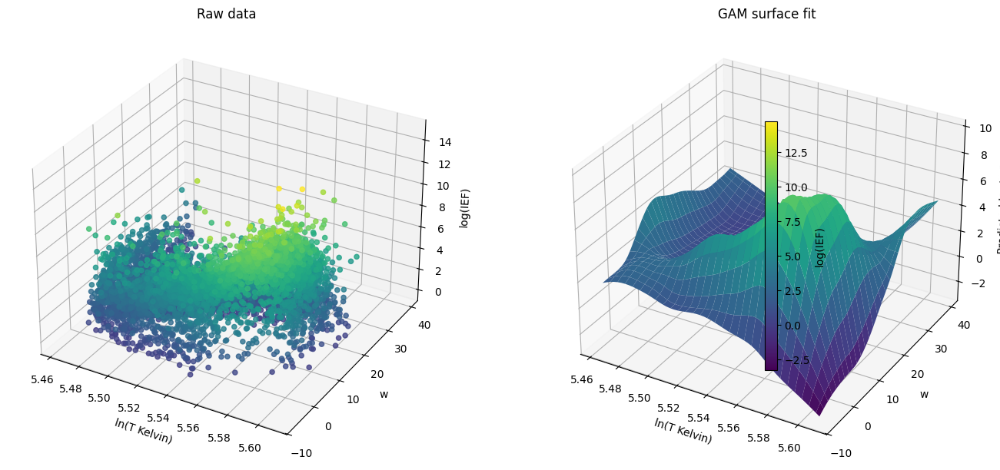

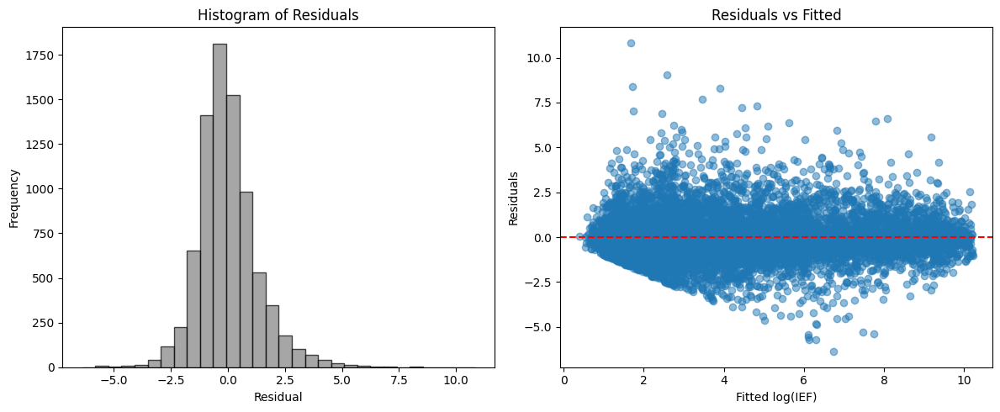

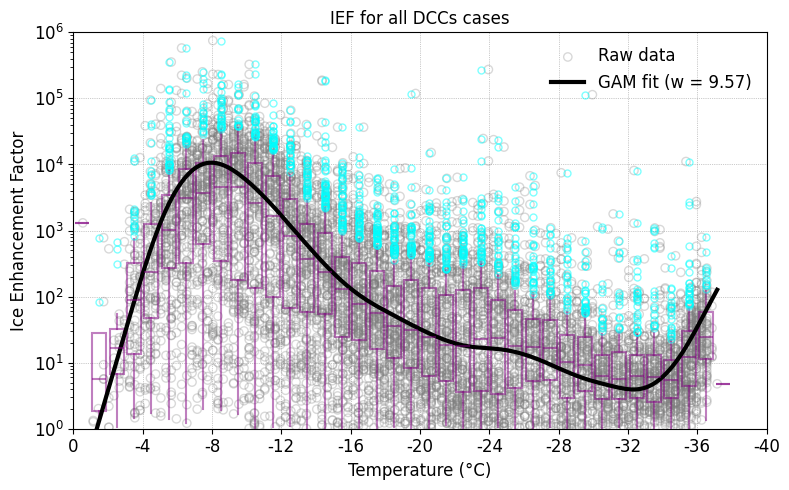

GAM R²: 0.7747766634961191


In [124]:
import numpy as np
import pandas as pd
from pygam import LinearGAM, s, te  # s = univariate spline, te = tensor (interaction)
import matplotlib.pyplot as plt
from matplotlib import colors
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.cm import ScalarMappable
from sklearn.metrics import r2_score

# Preprocessing as before...

X = np.vstack([np.log(T_kelvin), w_vals]).T
y = log_IEF_vals

# Build a GAM with a tensor spline over both predictors
gam = LinearGAM(te(0, 1, n_splines=20, spline_order=3)).fit(X, y)
y_fit = gam.predict(X)
r2 = r2_score(y, y_fit)
print("GAM R²:", r2)

# Create grid for surface
T_grid = np.linspace(np.min(T_kelvin), np.max(T_kelvin), 60)
w_grid = np.linspace(np.min(w_vals), np.max(w_vals), 60)
Tg, wg = np.meshgrid(T_grid, w_grid)
Xg = np.vstack([np.log(Tg).ravel(), wg.ravel()]).T
yg_flat = gam.predict(Xg)
yg = yg_flat.reshape(Tg.shape)

# 3D plots
fig = plt.figure(figsize=(14,6))
ax1 = fig.add_subplot(121, projection='3d')
norm = colors.Normalize(vmin=min(np.min(y), np.min(yg)), vmax=max(np.max(y), np.max(yg)))
cmap = plt.get_cmap('viridis')
sc = ax1.scatter(np.log(T_kelvin), w_vals, y, c=y, cmap=cmap, norm=norm, alpha=0.8)
ax1.set_xlabel('ln(T Kelvin)')
ax1.set_ylabel('w')
ax1.set_zlabel('log(IEF)')
ax1.set_title('Raw data')

ax2 = fig.add_subplot(122, projection='3d')
surf = ax2.plot_surface(np.log(Tg), wg, yg, cmap=cmap, norm=norm, alpha=1.0)
ax2.set_xlabel('ln(T Kelvin)')
ax2.set_ylabel('w')
ax2.set_zlabel('Predicted log(IEF)')
ax2.set_title('GAM surface fit')

sm = ScalarMappable(norm=norm, cmap=cmap)
cbar = fig.colorbar(sm, ax=[ax1, ax2], orientation='vertical', shrink=0.7)
cbar.set_label('log(IEF)')
plt.tight_layout()
plt.show()

# Residuals
residuals = y - y_fit
fig, axs = plt.subplots(1,2, figsize=(12,5))
axs[0].hist(residuals, bins=30, color='gray', edgecolor='black', alpha=0.7)
axs[0].set_title('Histogram of Residuals')
axs[0].set_xlabel('Residual')
axs[0].set_ylabel('Frequency')
axs[1].scatter(y_fit, residuals, alpha=0.5)
axs[1].axhline(0, color='red', linestyle='--')
axs[1].set_title('Residuals vs Fitted')
axs[1].set_xlabel('Fitted log(IEF)')
axs[1].set_ylabel('Residuals')
plt.tight_layout()
plt.show()

# 2D slice: IEF vs T, at w = w_mean
def predict_log_IEF_gam(T_cel, w, gam):
    T_kel = T_cel + 273.16
    lnT = np.log(T_kel)
    Xq = np.vstack([lnT, w]).T
    return gam.predict(Xq)

plt.figure(figsize=(8,5))
plt.boxplot(boxplot_tempc_ief_data,
            positions=tempc_bin_centers,
            vert=True, patch_artist=True, widths=wd,
            boxprops=dict(facecolor='none', edgecolor='purple', linewidth=ln1, alpha=al2),
            medianprops=dict(color='purple', linewidth=ln1, alpha=al2),
            whiskerprops=dict(linewidth=ln1, color='purple', alpha=al2),
            capprops=dict(linewidth=ln1, color='none', alpha=al2),
            flierprops=dict(marker='o', markerfacecolor='None', markeredgecolor='cyan',
                            markersize=5, alpha=al2),
            showfliers=True)

plt.scatter(T_vals, IEF_vals, color='gray', facecolor='none', edgecolor='gray', alpha=0.3, label='Raw data')

T_plot = np.linspace(np.min(T_vals), np.max(T_vals), 200)
w_mean = np.mean(w_vals)
log_fit_curve = predict_log_IEF_gam(T_plot, np.full_like(T_plot, w_mean), gam)
fit_curve = np.exp(log_fit_curve)

plt.plot(T_plot, fit_curve, 'k-', linewidth=3, label=f'GAM fit (w = {w_mean:.2f})')

plt.yscale('log')
plt.xlim(0., -40.)
plt.xticks(ticks=[0, -4, -8, -12, -16, -20, -24, -28, -32, -36, -40],
           labels=[str(x) for x in [0, -4, -8, -12, -16, -20, -24, -28, -32, -36, -40]],
           fontsize=fnt)

plt.yscale('log')
plt.ylim(1.0, 1.e6)
plt.yticks(fontsize=fnt)
plt.xlabel('Temperature (°C)', fontsize=fnt)
plt.ylabel('Ice Enhancement Factor', fontsize=fnt)
plt.title('IEF for all DCCs cases', fontsize=fnt)
plt.legend(frameon=False, fontsize=fnt)
plt.grid(True, linestyle=':', linewidth=0.5, color='gray', alpha=0.8)
plt.tight_layout()
plt.show()

print("GAM R²:", r2)


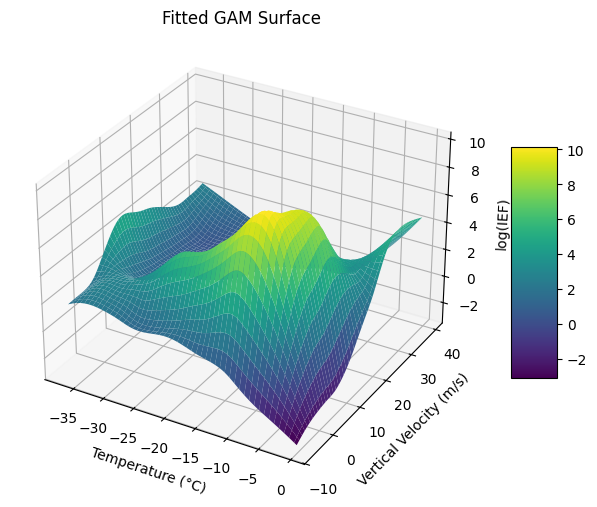

In [125]:
import matplotlib.pyplot as plt

# Create a 2D grid for prediction
T_plot = np.linspace(np.min(X[:, 0]), np.max(X[:, 0]), 100)  # log(T)
w_plot = np.linspace(np.min(X[:, 1]), np.max(X[:, 1]), 100)  # w
T_mesh, w_mesh = np.meshgrid(T_plot, w_plot)
X_grid = np.vstack([T_mesh.ravel(), w_mesh.ravel()]).T

# Predict using GAM
Z = gam.predict(X_grid).reshape(T_mesh.shape)

# Plot surface
fig = plt.figure(figsize=(10, 6))
ax = fig.add_subplot(111, projection='3d')
surf = ax.plot_surface(np.exp(T_mesh) - 273.16, w_mesh, Z, cmap='viridis', edgecolor='none')

ax.set_xlabel('Temperature (°C)')
ax.set_ylabel('Vertical Velocity (m/s)')
ax.set_zlabel('log(IEF)')
ax.set_title('Fitted GAM Surface')
plt.colorbar(surf, shrink=0.5, aspect=5)
plt.show()


In [137]:
import numpy as np
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score

X = np.column_stack((T_kelvin, w_vals))
y = log_IEF_vals

degree = 4

poly = PolynomialFeatures(degree)
X_poly = poly.fit_transform(X)

model = LinearRegression()
model.fit(X_poly, y)

# Predict on training data
y_pred = model.predict(X_poly)

# Calculate R² score
r2 = r2_score(y, y_pred)
print(f"Polynomial degree {degree} R²: {r2:.2f}")


Polynomial degree 4 R²: 0.70


Polynomial degree 4 R²: 0.699

Fitted polynomial regression equation for log(IEF):
log(IEF) = 4514 + (-0.003015)*T_kelvin + (0.003078)*wvel + (-0.4325)*T_kelvin^2 + (0.3703)*T_kelvin wvel + (-2.49)*wvel^2 + (0.0023)*T_kelvin^3 + (-0.002984)*T_kelvin^2 wvel + (0.02057)*T_kelvin wvel^2 + (-0.002228)*wvel^3 + (-3.434e-06)*T_kelvin^4 + (6.021e-06)*T_kelvin^3 wvel + (-4.337e-05)*T_kelvin^2 wvel^2 + (1.968e-05)*T_kelvin wvel^3 + (-3.61e-05)*wvel^4


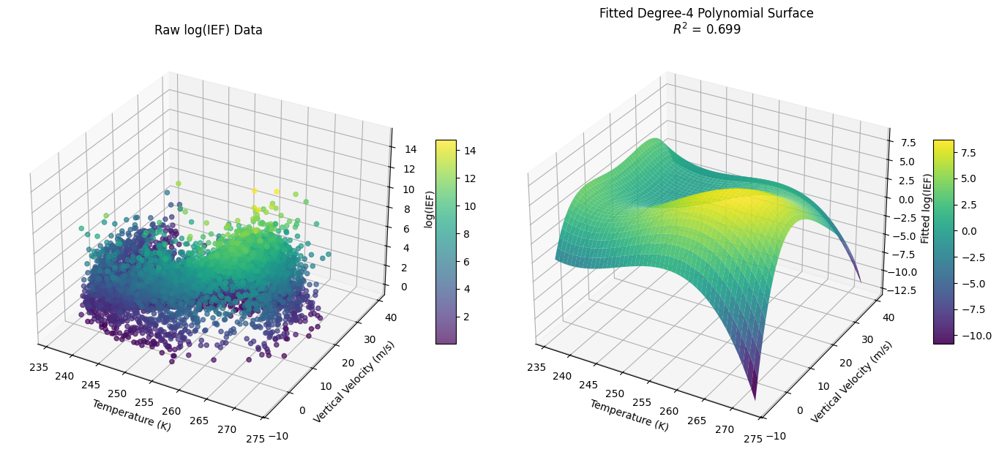

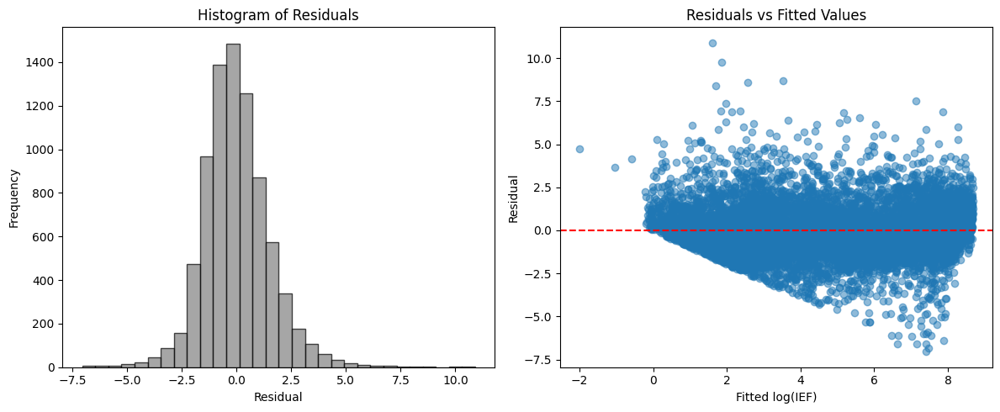

In [138]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score
from mpl_toolkits.mplot3d import Axes3D  # needed for 3d plotting (even if unused explicitly)

# Assuming you have these from your data preprocessing step
# T_kelvin, w_vals, log_IEF_vals

# For example:
# T_kelvin = df_ief['tempc'].values + 273.16
# w_vals = df_ief['wvel'].values
# log_IEF_vals = df_ief['LOG_IEF'].values

# 1. Prepare data
X = np.column_stack((T_kelvin, w_vals))
y = log_IEF_vals

# 2. Polynomial features (degree 4)
degree = 4
poly = PolynomialFeatures(degree)
X_poly = poly.fit_transform(X)

# 3. Fit Linear Regression
model = LinearRegression()
model.fit(X_poly, y)

# 4. Predict on training data
y_pred = model.predict(X_poly)

# 5. Calculate R2
r2 = r2_score(y, y_pred)
print(f"Polynomial degree {degree} R²: {r2:.3f}")

# 6. Print polynomial equation
feature_names = poly.get_feature_names_out(['T_kelvin', 'wvel'])
coef = model.coef_
intercept = model.intercept_

print("\nFitted polynomial regression equation for log(IEF):")
equation_terms = []
for c, name in zip(coef, feature_names):
    # Skip zero terms for clarity
    if abs(c) > 1e-8:
        equation_terms.append(f"({c:.4g})*{name}")
equation = " + ".join(equation_terms)
equation = f"log(IEF) = {intercept:.4g} + " + equation
print(equation)

# 7. Create grid for plotting fitted surface
T_grid = np.linspace(np.min(T_kelvin), np.max(T_kelvin), 50)
w_grid = np.linspace(np.min(w_vals), np.max(w_vals), 50)
T_mesh, w_mesh = np.meshgrid(T_grid, w_grid)

# Flatten grid for prediction
X_grid = np.column_stack((T_mesh.ravel(), w_mesh.ravel()))
X_grid_poly = poly.transform(X_grid)
y_grid_pred = model.predict(X_grid_poly)
y_grid_pred_mesh = y_grid_pred.reshape(T_mesh.shape)

# 8. Plotting

# Raw data scatter
fig = plt.figure(figsize=(14, 6))

ax1 = fig.add_subplot(121, projection='3d')
sc = ax1.scatter(T_kelvin, w_vals, y, c=y, cmap='viridis', alpha=0.7)
ax1.set_xlabel('Temperature (K)')
ax1.set_ylabel('Vertical Velocity (m/s)')
ax1.set_zlabel('log(IEF)')
ax1.set_title('Raw log(IEF) Data')
plt.colorbar(sc, ax=ax1, shrink=0.5, aspect=10)

# Fitted surface
ax2 = fig.add_subplot(122, projection='3d')
surf = ax2.plot_surface(T_mesh, w_mesh, y_grid_pred_mesh, cmap='viridis', alpha=0.9)
ax2.set_xlabel('Temperature (K)')
ax2.set_ylabel('Vertical Velocity (m/s)')
ax2.set_zlabel('Fitted log(IEF)')
ax2.set_title(f'Fitted Degree-{degree} Polynomial Surface\n$R^2$ = {r2:.3f}')
plt.colorbar(surf, ax=ax2, shrink=0.5, aspect=10)

plt.tight_layout()
plt.show()

# 9. Residual plots
import matplotlib.gridspec as gridspec

residuals = y - y_pred

fig = plt.figure(figsize=(12, 5))
gs = gridspec.GridSpec(1, 2)

ax0 = fig.add_subplot(gs[0])
ax0.hist(residuals, bins=30, color='gray', edgecolor='black', alpha=0.7)
ax0.set_title('Histogram of Residuals')
ax0.set_xlabel('Residual')
ax0.set_ylabel('Frequency')

ax1 = fig.add_subplot(gs[1])
ax1.scatter(y_pred, residuals, alpha=0.5)
ax1.axhline(0, color='red', linestyle='--')
ax1.set_title('Residuals vs Fitted Values')
ax1.set_xlabel('Fitted log(IEF)')
ax1.set_ylabel('Residual')

plt.tight_layout()
plt.show()


In [116]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score

X = np.vstack([np.log(T_kelvin), w_vals]).T
y = log_IEF_vals

# Split into train/test for evaluation
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Fit the model
rf = RandomForestRegressor(n_estimators=400, max_depth=10, random_state=0)
rf.fit(X_train, y_train)

# Predict and evaluate
y_pred = rf.predict(X_test)
r2 = r2_score(y_test, y_pred)
print(f"Random Forest R²: {r2:.3f}")


Random Forest R²: 0.720


In [110]:
from sklearn.ensemble import HistGradientBoostingRegressor

gb = HistGradientBoostingRegressor(max_iter=300, learning_rate=0.05, max_depth=8, random_state=0)
gb.fit(X_train, y_train)
y_pred_gb = gb.predict(X_test)

r2_gb = r2_score(y_test, y_pred_gb)
print(f"Gradient Boosting R²: {r2_gb:.3f}")


Gradient Boosting R²: 0.736


Gradient Boosting R²: 0.736


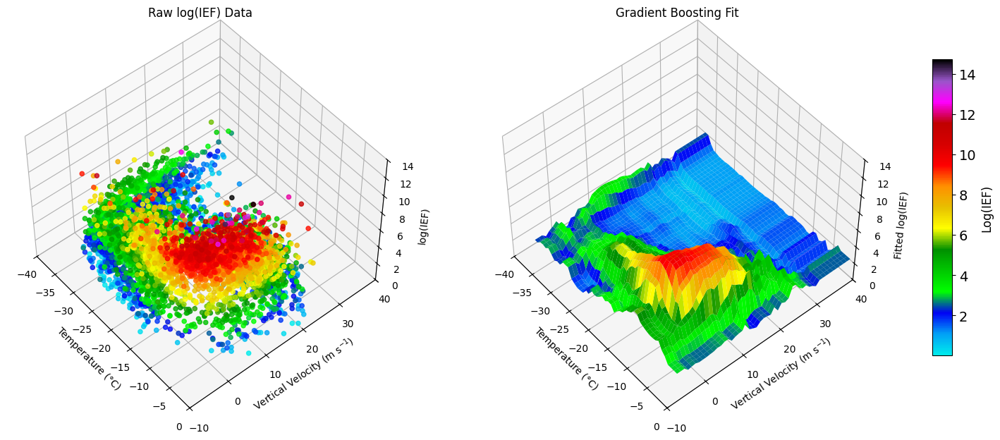

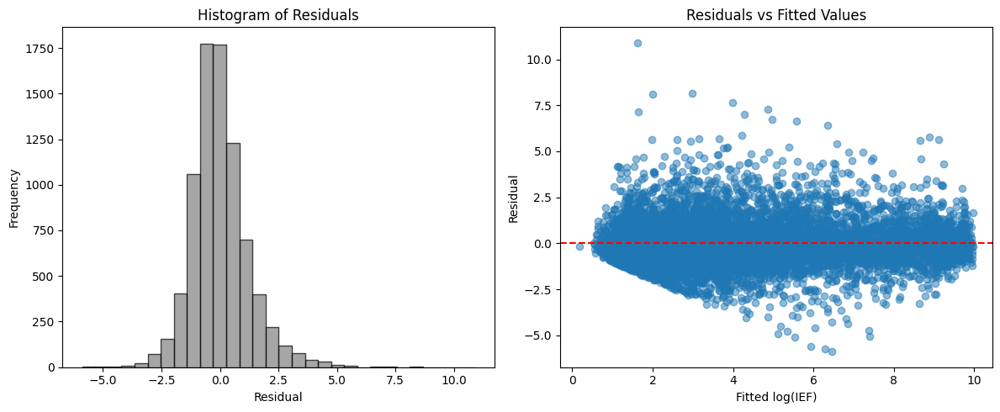

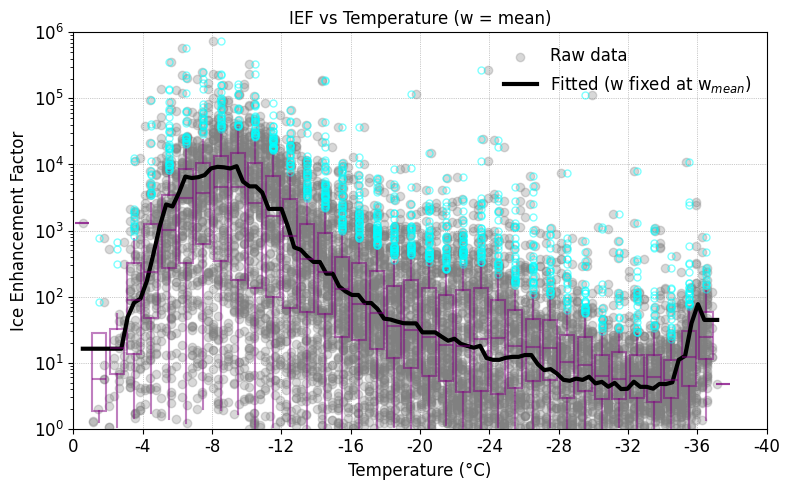

In [117]:
from sklearn.ensemble import HistGradientBoostingRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score
from matplotlib.colors import Normalize
from matplotlib.cm import ScalarMappable

# ------------------ 1. Prepare Data ------------------
X = np.vstack([np.log(T_kelvin), w_vals]).T  # Features: log(T), w
y = log_IEF_vals                             # Target: log(IEF)

# Split for evaluation
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# ------------------ 2. Fit Gradient Boosting ------------------
model = HistGradientBoostingRegressor(max_iter=300, learning_rate=0.05, max_depth=8, random_state=0)
model.fit(X_train, y_train)

# ------------------ 3. Predict and Evaluate ------------------
y_pred = model.predict(X_test)
r2 = r2_score(y_test, y_pred)
print(f"Gradient Boosting R²: {r2:.3f}")

# ------------------ 4. 3D Surface Prediction ------------------
T_grid = np.linspace(np.min(T_kelvin), np.max(T_kelvin), 50)
w_grid = np.linspace(np.min(w_vals), np.max(w_vals), 50)
T_mesh, w_mesh = np.meshgrid(T_grid, w_grid)
X_mesh = np.vstack([np.log(T_mesh.flatten()), w_mesh.flatten()]).T
log_IEF_mesh = model.predict(X_mesh).reshape(T_mesh.shape)

# ------------------ 5. Residuals ------------------
y_fit = model.predict(X)
residuals = y - y_fit

# ------------------ 6. 3D Plot ------------------
fig = plt.figure(figsize=(14, 6))
cmap = plt.get_cmap('pyart_NWSRef')
norm = Normalize(vmin=min(y.min(), log_IEF_mesh.min()), vmax=max(y.max(), log_IEF_mesh.max()))
sm = ScalarMappable(norm=norm, cmap=cmap)

# Raw data
ax1 = fig.add_subplot(121, projection='3d')
sc = ax1.scatter(T_vals, w_vals, y, c=y, cmap=cmap, norm=norm, alpha=0.8)
ax1.set_xlim(0, -40)
ax1.set_ylim(-10, 40)
ax1.set_zlim(0, 14)
ax1.view_init(elev=50, azim=320)
ax1.invert_xaxis()
ax1.set_xlabel('Temperature (°C)')
ax1.set_ylabel('Vertical Velocity (m s$^{-1}$)')
ax1.set_zlabel('log(IEF)')
ax1.set_title('Raw log(IEF) Data')

# Fitted surface
ax2 = fig.add_subplot(122, projection='3d')
surf = ax2.plot_surface(T_mesh - 273.16, w_mesh, log_IEF_mesh, cmap=cmap, norm=norm, alpha=1)
ax2.set_xlim(0, -40)
ax2.set_ylim(-10, 40)
ax2.set_zlim(0, 14)
ax2.view_init(elev=50, azim=320)
ax2.invert_xaxis()
ax2.set_xlabel('Temperature (°C)')
ax2.set_ylabel('Vertical Velocity (m s$^{-1}$)')
ax2.set_zlabel('Fitted log(IEF)')
ax2.set_title('Gradient Boosting Fit')

# Shared colorbar
cbar_ax = fig.add_axes([1.0, 0.15, 0.02, 0.7])
cbar1 = fig.colorbar(sm, cax=cbar_ax, orientation='vertical', ticks=[0, 2, 4, 6, 8, 10, 12, 14])
cbar1.set_label('Log(IEF)', fontsize=12)
cbar1.ax.tick_params(labelsize=14)
plt.tight_layout()
plt.show()

# ------------------ 7. Residual Plots ------------------
fig, axs = plt.subplots(1, 2, figsize=(12, 5))
axs[0].hist(residuals, bins=30, color='gray', edgecolor='black', alpha=0.7)
axs[0].set_title('Histogram of Residuals')
axs[0].set_xlabel('Residual')
axs[0].set_ylabel('Frequency')
axs[1].scatter(y_fit, residuals, alpha=0.5)
axs[1].axhline(0, color='red', linestyle='--')
axs[1].set_title('Residuals vs Fitted Values')
axs[1].set_xlabel('Fitted log(IEF)')
axs[1].set_ylabel('Residual')
plt.tight_layout()
plt.show()

# ------------------ 8. 2D Slice Plot (IEF vs Temp) ------------------
def predict_IEF(T_celsius, w_const):
    X_pred = np.vstack([np.log(T_celsius + 273.16), np.full_like(T_celsius, w_const)]).T
    return np.exp(model.predict(X_pred))

plt.figure(figsize=(8, 5))
plt.boxplot(boxplot_tempc_ief_data,
            positions=tempc_bin_centers,
            vert=True, patch_artist=True, widths=0.8,
            boxprops=dict(facecolor='none', edgecolor='purple', linewidth=1.5, alpha=0.5),
            medianprops=dict(color='purple', linewidth=1.5, alpha=0.5),
            whiskerprops=dict(linewidth=1.5, color='purple', alpha=0.5),
            capprops=dict(linewidth=1.5, color='none', alpha=0.5),
            flierprops=dict(marker='o', markerfacecolor='None', markeredgecolor='cyan',
                            markersize=5, alpha=0.5),
            showfliers=True)

plt.scatter(T_vals, IEF_vals, color='gray', edgecolor='gray', alpha=0.3, label='Raw data')

T_vals_plot = np.linspace(np.min(T_vals), np.max(T_vals), 100)
w_mean = np.mean(w_vals)
fitted_curve = predict_IEF(T_vals_plot, w_mean)

plt.plot(T_vals_plot, fitted_curve, 'k-', linewidth=3, label='Fitted (w fixed at w$_{mean}$)')

plt.yscale('log')
plt.xlim(0., -40.)
plt.xticks(ticks=[0, -4, -8, -12, -16, -20, -24, -28, -32, -36, -40],
           labels=[str(x) for x in [0, -4, -8, -12, -16, -20, -24, -28, -32, -36, -40]],
           fontsize=12)

plt.ylim(1.0, 1.e6)
plt.yticks(fontsize=12)
plt.xlabel('Temperature (°C)', fontsize=12)
plt.ylabel('Ice Enhancement Factor', fontsize=12)
plt.title('IEF vs Temperature (w = mean)', fontsize=12)
plt.legend(frameon=False, fontsize=12)
plt.grid(True, linestyle=':', linewidth=0.5, color='grey', alpha=0.8)
plt.tight_layout()
plt.show()


Random Forest R²: 0.717


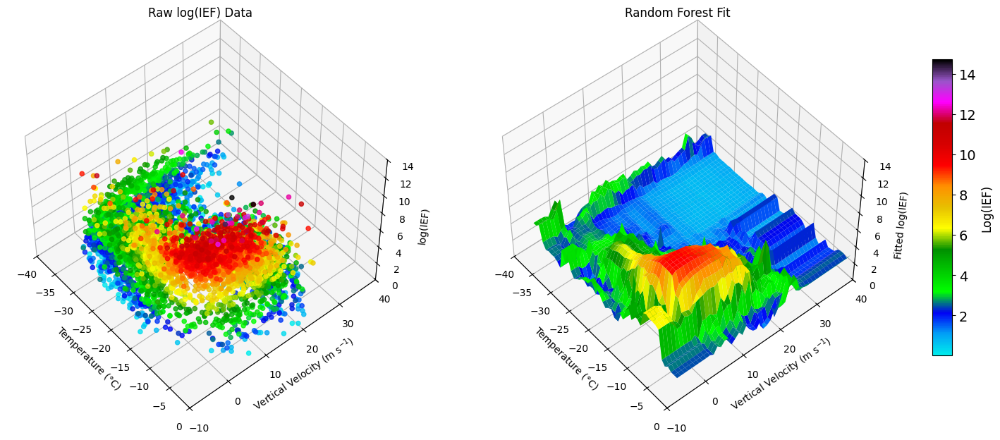

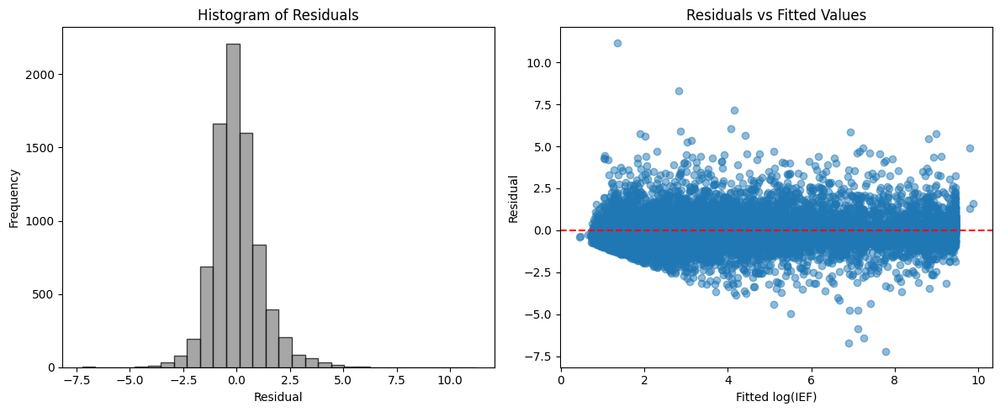

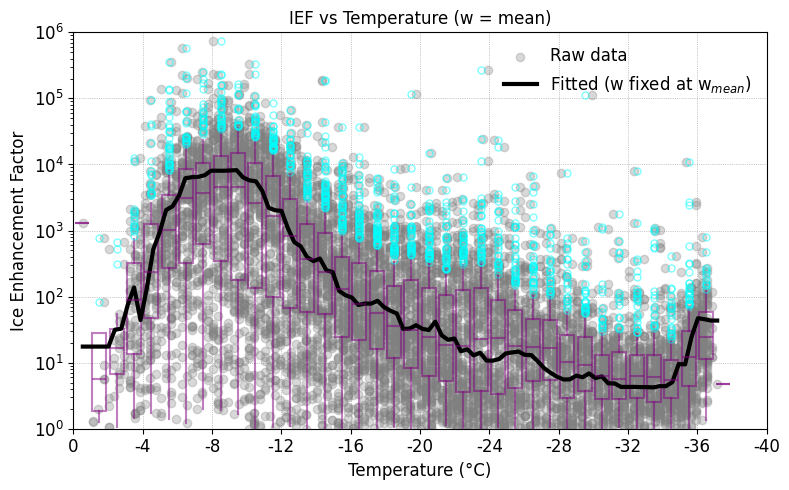

In [118]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score
from matplotlib.colors import Normalize
from matplotlib.cm import ScalarMappable

# ------------------ 1. Prepare Data ------------------
X = np.vstack([np.log(T_kelvin), w_vals]).T  # Features: log(T), w
y = log_IEF_vals                             # Target: log(IEF)

# Split for evaluation
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# ------------------ 2. Fit Random Forest ------------------
model = RandomForestRegressor(n_estimators=100, max_depth=10, random_state=0)
model.fit(X_train, y_train)

# ------------------ 3. Predict and Evaluate ------------------
y_pred = model.predict(X_test)
r2 = r2_score(y_test, y_pred)
print(f"Random Forest R²: {r2:.3f}")

# ------------------ 4. 3D Surface Prediction ------------------
T_grid = np.linspace(np.min(T_kelvin), np.max(T_kelvin), 50)
w_grid = np.linspace(np.min(w_vals), np.max(w_vals), 50)
T_mesh, w_mesh = np.meshgrid(T_grid, w_grid)
X_mesh = np.vstack([np.log(T_mesh.flatten()), w_mesh.flatten()]).T
log_IEF_mesh = model.predict(X_mesh).reshape(T_mesh.shape)

# ------------------ 5. Residuals ------------------
y_fit = model.predict(X)
residuals = y - y_fit

# ------------------ 6. 3D Plot ------------------
fig = plt.figure(figsize=(14, 6))
cmap = plt.get_cmap('pyart_NWSRef')
norm = Normalize(vmin=min(y.min(), log_IEF_mesh.min()), vmax=max(y.max(), log_IEF_mesh.max()))
sm = ScalarMappable(norm=norm, cmap=cmap)

# Raw data
ax1 = fig.add_subplot(121, projection='3d')
sc = ax1.scatter(T_vals, w_vals, y, c=y, cmap=cmap, norm=norm, alpha=0.8)
ax1.set_xlim(0, -40)
ax1.set_ylim(-10, 40)
ax1.set_zlim(0, 14)
ax1.view_init(elev=50, azim=320)
ax1.invert_xaxis()
ax1.set_xlabel('Temperature (°C)')
ax1.set_ylabel('Vertical Velocity (m s$^{-1}$)')
ax1.set_zlabel('log(IEF)')
ax1.set_title('Raw log(IEF) Data')

# Fitted surface
ax2 = fig.add_subplot(122, projection='3d')
surf = ax2.plot_surface(T_mesh - 273.16, w_mesh, log_IEF_mesh, cmap=cmap, norm=norm, alpha=1)
ax2.set_xlim(0, -40)
ax2.set_ylim(-10, 40)
ax2.set_zlim(0, 14)
ax2.view_init(elev=50, azim=320)
ax2.invert_xaxis()
ax2.set_xlabel('Temperature (°C)')
ax2.set_ylabel('Vertical Velocity (m s$^{-1}$)')
ax2.set_zlabel('Fitted log(IEF)')
ax2.set_title('Random Forest Fit')

# Shared colorbar
cbar_ax = fig.add_axes([1.0, 0.15, 0.02, 0.7])
cbar1 = fig.colorbar(sm, cax=cbar_ax, orientation='vertical', ticks=[0, 2, 4, 6, 8, 10, 12, 14])
cbar1.set_label('Log(IEF)', fontsize=12)
cbar1.ax.tick_params(labelsize=14)
plt.tight_layout()
plt.show()

# ------------------ 7. Residual Plots ------------------
fig, axs = plt.subplots(1, 2, figsize=(12, 5))
axs[0].hist(residuals, bins=30, color='gray', edgecolor='black', alpha=0.7)
axs[0].set_title('Histogram of Residuals')
axs[0].set_xlabel('Residual')
axs[0].set_ylabel('Frequency')
axs[1].scatter(y_fit, residuals, alpha=0.5)
axs[1].axhline(0, color='red', linestyle='--')
axs[1].set_title('Residuals vs Fitted Values')
axs[1].set_xlabel('Fitted log(IEF)')
axs[1].set_ylabel('Residual')
plt.tight_layout()
plt.show()

# ------------------ 8. 2D Slice Plot (IEF vs Temp) ------------------
def predict_IEF(T_celsius, w_const):
    X_pred = np.vstack([np.log(T_celsius + 273.16), np.full_like(T_celsius, w_const)]).T
    return np.exp(model.predict(X_pred))

plt.figure(figsize=(8, 5))
plt.boxplot(boxplot_tempc_ief_data,
            positions=tempc_bin_centers,
            vert=True, patch_artist=True, widths=0.8,
            boxprops=dict(facecolor='none', edgecolor='purple', linewidth=1.5, alpha=0.5),
            medianprops=dict(color='purple', linewidth=1.5, alpha=0.5),
            whiskerprops=dict(linewidth=1.5, color='purple', alpha=0.5),
            capprops=dict(linewidth=1.5, color='none', alpha=0.5),
            flierprops=dict(marker='o', markerfacecolor='None', markeredgecolor='cyan',
                            markersize=5, alpha=0.5),
            showfliers=True)

plt.scatter(T_vals, IEF_vals, color='gray', edgecolor='gray', alpha=0.3, label='Raw data')

T_vals_plot = np.linspace(np.min(T_vals), np.max(T_vals), 100)
w_mean = np.mean(w_vals)
fitted_curve = predict_IEF(T_vals_plot, w_mean)

plt.plot(T_vals_plot, fitted_curve, 'k-', linewidth=3, label='Fitted (w fixed at w$_{mean}$)')

plt.yscale('log')
plt.xlim(0., -40.)
plt.xticks(ticks=[0, -4, -8, -12, -16, -20, -24, -28, -32, -36, -40],
           labels=[str(x) for x in [0, -4, -8, -12, -16, -20, -24, -28, -32, -36, -40]],
           fontsize=12)

plt.ylim(1.0, 1.e6)
plt.yticks(fontsize=12)
plt.xlabel('Temperature (°C)', fontsize=12)
plt.ylabel('Ice Enhancement Factor', fontsize=12)
plt.title('IEF vs Temperature (w = mean)', fontsize=12)
plt.legend(frameon=False, fontsize=12)
plt.grid(True, linestyle=':', linewidth=0.5, color='grey', alpha=0.8)
plt.tight_layout()
plt.show()
